

# Term Project




#### Student ID: 113489701
#### Course: Data Analytics (PE 5970)
#### Instructor: Dr. Deepak Devegowda

## TITLE: Machine Learning Applications In Predicting Rate Of Penetration    (ROP) Using Drilling Parameters (WOB, RPM, SPP, TORQ , Mudflowrate (FLOW_IN) and Well Logs(GR, NPOR,  DPHZ)

1. WOB-Weight on Bit
2. RPM-Rotation Per Minute
3. SPP-Standpipe Pressure
4. TORQ-Drilling Torque
5. GR-Gamma Ray Log
6. NPOR-Neutron Porosity Log
7. DPHZ-Formation Bulk Density Porosity Log

### Data Source: Well 58-32_Utah Forge Field

# OBJECTIVES

1. Construct a regression model  (without lithology) to predict ROP using drilling parameters with different ML algorithms.   Chose best model based on metrics (MODEL 1).
   Machine Learning Algoriths used;
   -K-Nearest Neighbours
   -Random Forest
   -Support Vector Machines
   
2. Construct a Lithology Classification model using Well Logs via unsupervised clustering to identify different lithologies.
   Machine Learning Algorithms used;
   -KMeans Clustering
   -Hierarchichal Clustering 
   
3. Construct a regression model to predict ROP using drilling parameters and lithology with different ML algorithms.
   Chose best model based on metrics (MODEL 2)

4. Compare performace of models (MODEL 1 and MODEL 2)

## WORKFLOW

In [5]:
# Importing libraries

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 
import pandas as pd
import sklearn
import warnings
import lasio 
import sklearn
import warnings
from sklearn import preprocessing

In [6]:
sns.set(style = 'ticks')
warnings.filterwarnings('ignore')

df = pd.read_csv('Well5832.csv', header = 0)

In [7]:
df.head()

,DEPTH,DEPTH_m,ROP,ROP_m,WOB,WOB_kg,TEMP_OUT,TEMP_OUT_C,TEMP_IN,TEMP_IN_C,...,TENS_TCOM,DEPTH_TP,T_LOG,LSPD,DTEMP,P_LOG,DPRES,TEMP_GRAD_F,TEMP_C,TEMP_GRAD_C
0,2151,655.61,9.97,3.04,24.69,11197.28,130.70,54.83,127.55,53.08,...,2187.7917,2151,164.4221,52.25,0.0552,785.8163,0.3646,7.643984,73.567833,112.212799
1,2152,655.92,4.97,1.51,24.24,10993.20,130.54,54.74,127.36,52.98,...,2179.3335,2152,164.4736,51.87,0.0545,786.2419,0.4597,7.642825,73.596444,112.203385
2,2153,656.23,9.36,2.85,23.20,10521.54,130.77,54.87,127.51,53.06,...,2180.9167,2153,164.5311,51.87,0.0586,786.7357,0.4317,7.641946,73.628389,112.199060
3,2154,656.53,8.29,2.53,24.36,11047.62,130.77,54.87,127.66,53.14,...,2212.3914,2154,164.6113,51.50,0.0651,787.2552,0.4087,7.642122,73.672944,112.215656
4,2155,656.84,12.96,3.95,23.57,10689.34,130.81,54.89,127.66,53.14,...,2194.5417,2155,164.6706,51.75,0.0642,787.6263,0.3921,7.641327,73.705889,112.212851


In [8]:
df=df[['DEPTH','ROP','WOB','RPM','FLOW_IN','SPP','TORQ','DPHZ','GR','NPOR']]

In [9]:
df.head()

,DEPTH,ROP,WOB,RPM,FLOW_IN,SPP,TORQ,DPHZ,GR,NPOR
0,2151,9.97,24.69,95.60,819.02,695.99,121.36,-0.6211,90.2802,0.3504
1,2152,4.97,24.24,80.83,820.05,694.84,158.54,-0.7892,93.8764,0.2824
2,2153,9.36,23.20,78.88,817.59,695.56,154.91,-1.0679,95.1038,0.1841
3,2154,8.29,24.36,81.68,815.95,695.70,160.63,-1.0829,103.1531,0.2431
4,2155,12.96,23.57,84.18,818.62,696.94,171.50,-0.8824,91.9644,0.2886


In [10]:
df.shape

(5282, 10)

In [11]:
df.size

52820

In [12]:
df.describe()

,DEPTH,ROP,WOB,RPM,FLOW_IN,SPP,TORQ,DPHZ,GR,NPOR
count,5282.000000,5282.000000,5282.000000,5282.000000,5282.000000,5282.000000,5282.000000,5282.000000,5282.000000,5282.000000
mean,4857.563991,19.066365,26.682465,45.065591,655.601448,1539.981236,141.277215,0.042047,167.830114,0.070093
std,1551.724572,13.806128,6.707256,16.595220,107.693740,234.700483,37.029317,0.093355,65.693209,0.074183
min,2151.000000,0.710000,0.000000,0.000000,0.000000,31.270000,0.000000,-1.082900,44.356500,-0.015600
25%,3517.250000,9.980000,21.592500,36.650000,612.712500,1393.560000,126.750000,0.020700,139.103375,0.013700
50%,4864.500000,13.980000,26.450000,43.610000,685.290000,1553.980000,144.790000,0.042800,167.708300,0.031000
75%,6199.750000,22.280000,32.770000,54.130000,713.530000,1731.460000,159.490000,0.083900,191.902125,0.127000
max,7536.000000,97.750000,47.050000,122.780000,3317.510000,2200.430000,273.710000,0.538100,641.089700,0.531700


# Data Visualization

In [13]:
df.isna().sum()# There are no missing values

DEPTH      0
ROP        0
WOB        0
RPM        0
FLOW_IN    0
SPP        0
TORQ       0
DPHZ       0
GR         0
NPOR       0
dtype: int64

In [ ]:
#Plotting histogram, boxplots and scatterplots for selected features

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C334BA0AC8>,
      dtype=object)

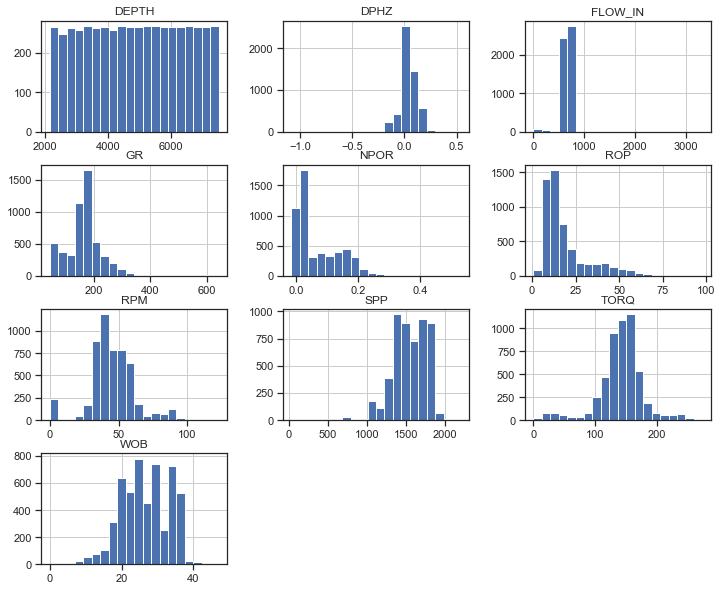

In [14]:
df.hist(figsize = (12, 10), bins= 20)

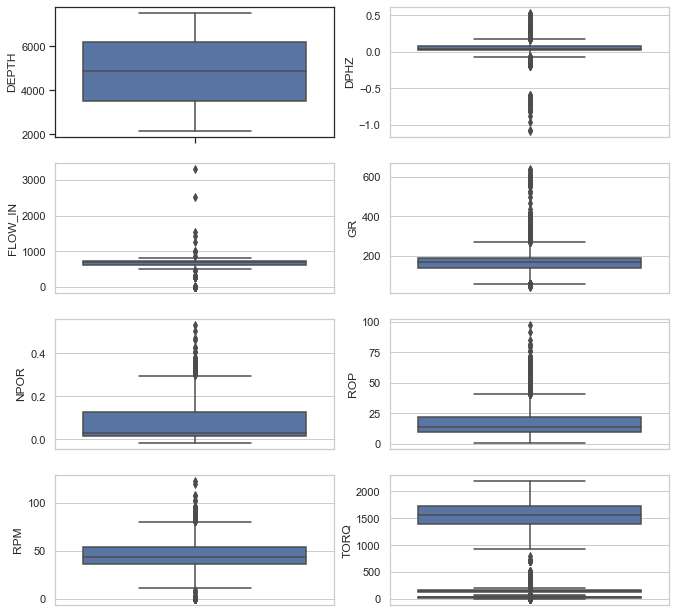

In [15]:
plt.figure(figsize = (11,11)) 
plt.subplot(4, 2, 1)  
sns.set(style="whitegrid")
sns.boxplot(y='DEPTH', data=df)

plt.subplot(4, 2, 2)  
sns.set(style="whitegrid")
sns.boxplot(y='DPHZ', data=df)

plt.subplot(4, 2, 3)  
sns.set(style="whitegrid")
sns.boxplot(y='FLOW_IN', data=df)

plt.subplot(4, 2, 4)  
sns.set(style="whitegrid")
sns.boxplot(y='GR', data=df)

plt.subplot(4, 2, 5)  
sns.set(style="whitegrid")
sns.boxplot(y='NPOR', data=df)

plt.subplot(4, 2, 6)  
sns.set(style="whitegrid")
sns.boxplot(y='ROP', data=df)

plt.subplot(4, 2, 7)  
sns.set(style="whitegrid")
sns.boxplot(y='RPM', data=df)

plt.subplot(4, 2, 8)  
sns.set(style="whitegrid")
sns.boxplot(y='WOB', data=df)

plt.subplot(4, 2, 8)  
sns.set(style="whitegrid")
sns.boxplot(y='SPP', data=df)

plt.subplot(4, 2, 8)  
sns.set(style="whitegrid")
sns.boxplot(y='TORQ', data=df)

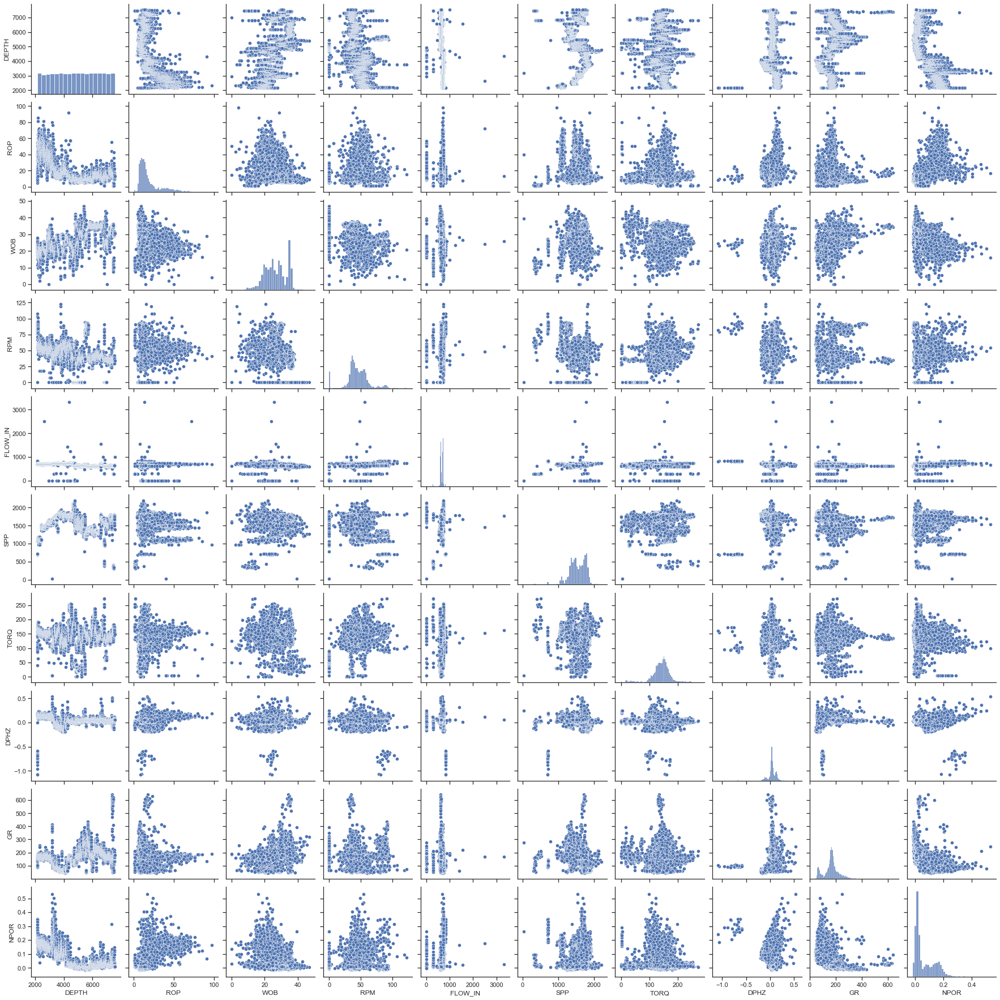

In [492]:
sns.set(style = 'ticks')
sns.pairplot(df)

plt.savefig("Matrix scatterplot.png", transparent=False);

In [17]:
#Plotting scatter plot of drilling parameters

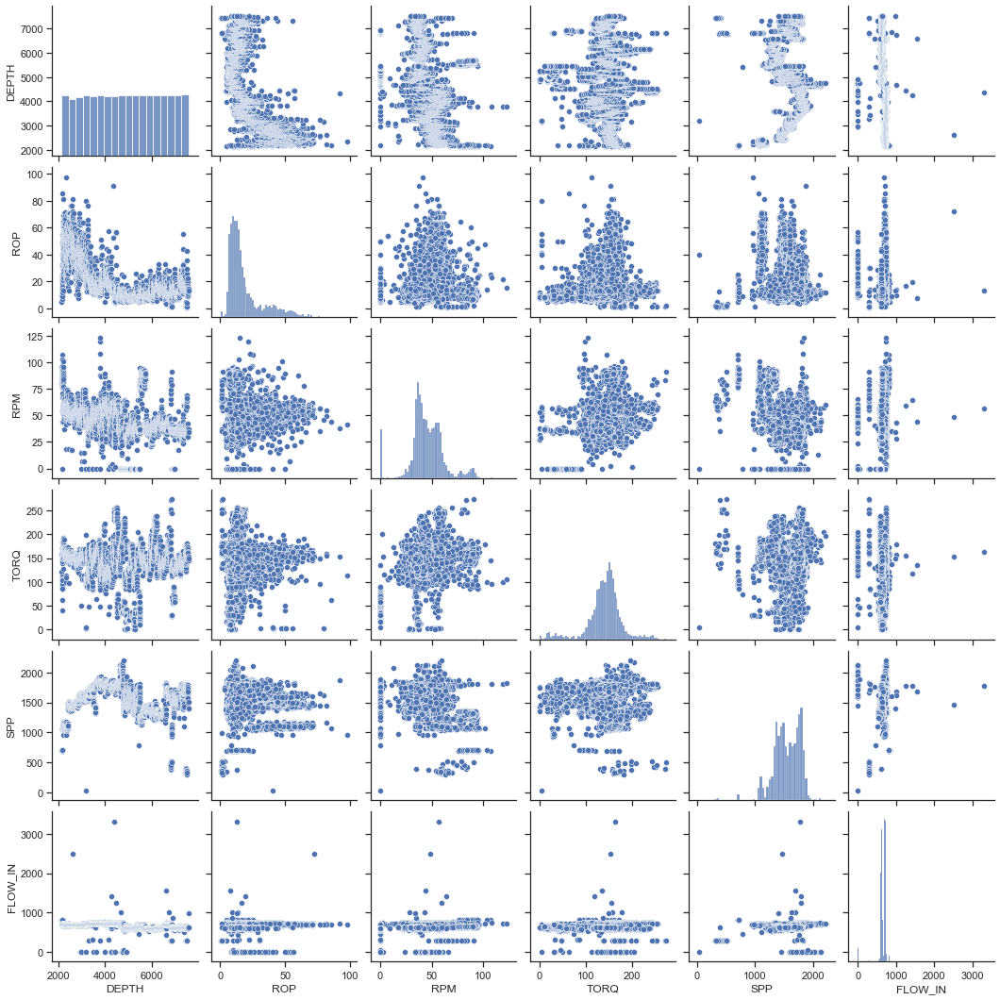

In [495]:
sns.set(style = 'ticks')
sns.pairplot(df,  vars=['DEPTH','ROP','RPM','TORQ','SPP', 'FLOW_IN'], palette=['blue'])


plt.savefig("Drilling parameters scatter.png", transparent=False);

In [19]:
#Plotting scatter plot of well logs

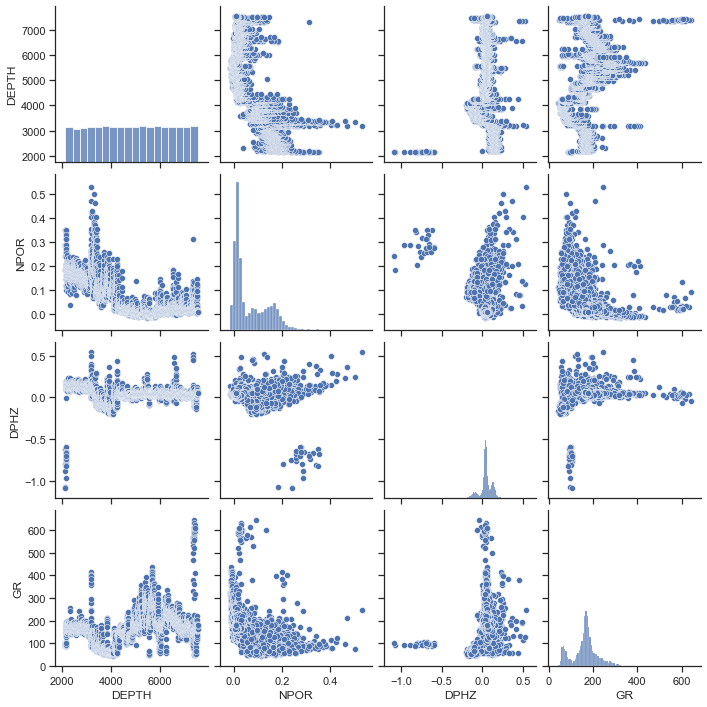

In [494]:
sns.set(style = 'ticks')
sns.pairplot(df,  vars=['DEPTH','NPOR','DPHZ','GR'])

plt.savefig("Well Logs scatter.png", transparent=False);

In [21]:
# some outliers observed

### Cleaning Data (Outlier Removal)

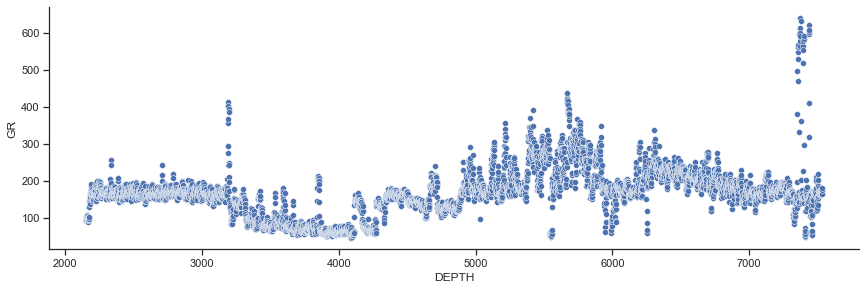

In [539]:
#There are some very high gamma ray values, above 250 API units 
sns.relplot(x = 'DEPTH', y = 'GR', height = 4, aspect = 3, data = df)

Zones with densities greater than that of limestone show negative bulk density porosity values (Kansas Geological Survey)
(http://www.kgs.ku.edu/Publications/Bulletins/LA/04_nuclear.html
Negative bulk density values are significantly distant from other data set hence can be considered as outliers

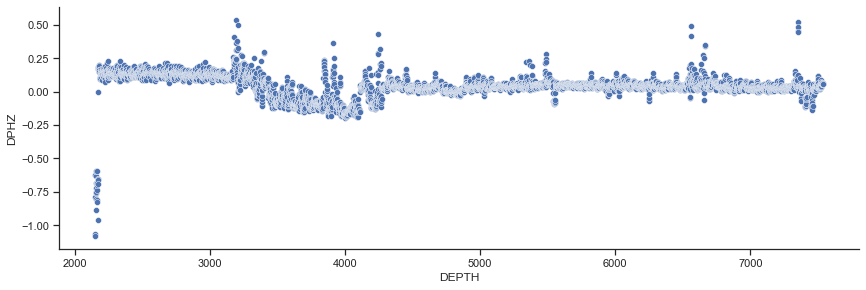

In [22]:
sns.relplot(x = 'DEPTH', y = 'DPHZ', height = 4, aspect = 3, data = df)

In [23]:
#Original shape of data

df.shape

(5282, 10)

In [234]:
#Selecting data with gamma ray less than 250 and DPHZ less than -4
clean_df = df[(df['GR'] < 250) & (df['DPHZ'] >-0.4)]

In [ ]:
# Thus, removing GR values above 250 and DPHZ values less than -4 does not affect the overall size of data by much 
# To keep the original data for future references, I would not drop the 'outlier areas' but use clean_df.

In [ ]:
# Further removing other outliers using zscore method

In [235]:
from scipy import stats

subset_clean_df = clean_df[['DEPTH','ROP','WOB','RPM','FLOW_IN','SPP','TORQ','DPHZ','GR','NPOR']]

subset_clean_df = subset_clean_df[(np.abs(stats.zscore(subset_clean_df)) < 3).all(axis=1)]

clean_df =clean_df.merge(subset_clean_df,on=['DEPTH','ROP','WOB','RPM','FLOW_IN','SPP','TORQ','DPHZ','GR','NPOR'])


In [236]:
clean_df.shape

(4430, 10)

In [238]:
clean_df.head()

,DEPTH,ROP,WOB,RPM,FLOW_IN,SPP,TORQ,DPHZ,GR,NPOR
0,2182,39.62,27.81,71.03,684.27,1063.55,103.64,0.1584,164.2335,0.1458
1,2183,32.47,15.31,66.92,692.04,1065.43,138.44,0.1629,156.8428,0.2059
2,2184,54.32,25.61,54.86,683.45,1065.16,143.06,0.1432,162.4369,0.1813
3,2186,50.00,15.09,0.00,708.21,1067.48,39.78,0.1414,177.9345,0.0990
4,2188,14.07,14.89,77.50,701.66,1064.21,149.23,0.1125,192.4346,0.1192


In [239]:
clean_df.describe()

,DEPTH,ROP,WOB,RPM,FLOW_IN,SPP,TORQ,DPHZ,GR,NPOR
count,4430.000000,4430.000000,4430.000000,4430.000000,4430.000000,4430.000000,4430.000000,4430.000000,4430.000000,4430.000000
mean,4824.382619,19.443889,26.432702,44.800743,668.249880,1565.615302,144.379795,0.041900,155.295214,0.071700
std,1577.036978,12.966345,6.450275,13.883121,52.664282,205.635488,32.339160,0.074514,47.252121,0.067498
min,2182.000000,1.000000,6.250000,0.000000,440.000000,949.200000,29.640000,-0.187500,44.356500,-0.010200
25%,3488.250000,10.632500,21.410000,36.780000,614.710000,1419.680000,128.110000,0.018700,135.425425,0.016400
50%,4660.500000,14.570000,26.100000,43.880000,690.800000,1580.480000,145.630000,0.041100,164.870650,0.036300
75%,6287.750000,23.247500,31.060000,53.670000,718.410000,1750.315000,159.782500,0.087375,182.817000,0.129375
max,7536.000000,62.240000,43.900000,90.730000,988.390000,2200.430000,252.740000,0.278400,249.904200,0.294000


In [240]:
clean_df.isna().sum() # No missen values

DEPTH      0
ROP        0
WOB        0
RPM        0
FLOW_IN    0
SPP        0
TORQ       0
DPHZ       0
GR         0
NPOR       0
dtype: int64

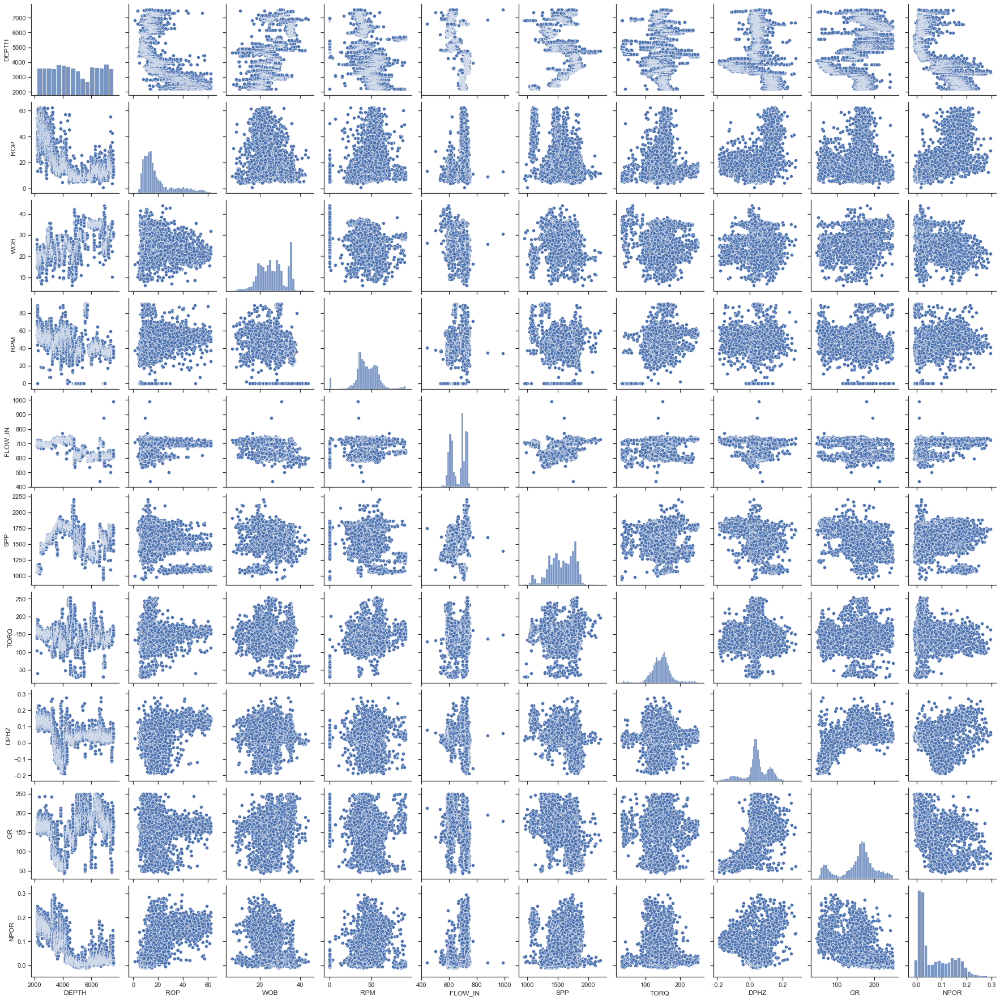

In [241]:
sns.set(style = 'ticks')
sns.pairplot(clean_df)

In [242]:
# Outliers significantly removed

# BIVARIATE STATISTICS 

In [243]:
#determining correlations between variables (original)
df.corr()


,DEPTH,ROP,WOB,RPM,FLOW_IN,SPP,TORQ,DPHZ,GR,NPOR
DEPTH,1.000000,-0.635554,0.564798,-0.341282,-0.327158,-0.046926,-0.036366,-0.110379,0.384049,-0.736708
ROP,-0.635554,1.000000,-0.317909,0.219044,0.186639,-0.099501,0.120087,0.383029,-0.124723,0.666577
WOB,0.564798,-0.317909,1.000000,-0.344414,-0.154342,-0.052020,-0.150570,-0.039090,0.357073,-0.438273
RPM,-0.341282,0.219044,-0.344414,1.000000,0.201529,-0.166596,0.459757,-0.046428,-0.081111,0.278670
FLOW_IN,-0.327158,0.186639,-0.154342,0.201529,1.000000,0.220306,0.029181,-0.052941,-0.208396,0.271395
SPP,-0.046926,-0.099501,-0.052020,-0.166596,0.220306,1.000000,-0.042994,-0.126180,-0.345464,-0.011906
TORQ,-0.036366,0.120087,-0.150570,0.459757,0.029181,-0.042994,1.000000,0.081384,0.008526,0.027084
DPHZ,-0.110379,0.383029,-0.039090,-0.046428,-0.052941,-0.126180,0.081384,1.000000,0.338043,0.162383
GR,0.384049,-0.124723,0.357073,-0.081111,-0.208396,-0.345464,0.008526,0.338043,1.000000,-0.409401
NPOR,-0.736708,0.666577,-0.438273,0.278670,0.271395,-0.011906,0.027084,0.162383,-0.409401,1.000000


In [244]:
#determining correlation between variables (clean)
clean_df.corr()


,DEPTH,ROP,WOB,RPM,FLOW_IN,SPP,TORQ,DPHZ,GR,NPOR
DEPTH,1.000000,-0.637678,0.599304,-0.437021,-0.679906,-0.031414,-0.068043,-0.203433,0.385733,-0.759756
ROP,-0.637678,1.000000,-0.314712,0.294670,0.321610,-0.207287,0.113158,0.471916,-0.041328,0.722998
WOB,0.599304,-0.314712,1.000000,-0.328590,-0.504272,-0.141648,-0.075328,-0.073187,0.326340,-0.444333
RPM,-0.437021,0.294670,-0.328590,1.000000,0.423611,-0.033000,0.399544,0.054499,-0.184982,0.350861
FLOW_IN,-0.679906,0.321610,-0.504272,0.423611,1.000000,0.510823,0.097874,-0.087158,-0.514572,0.519763
SPP,-0.031414,-0.207287,-0.141648,-0.033000,0.510823,1.000000,-0.040461,-0.440560,-0.521072,-0.025205
TORQ,-0.068043,0.113158,-0.075328,0.399544,0.097874,-0.040461,1.000000,0.120420,0.059951,0.038664
DPHZ,-0.203433,0.471916,-0.073187,0.054499,-0.087158,-0.440560,0.120420,1.000000,0.563282,0.305794
GR,0.385733,-0.041328,0.326340,-0.184982,-0.514572,-0.521072,0.059951,0.563282,1.000000,-0.387857
NPOR,-0.759756,0.722998,-0.444333,0.350861,0.519763,-0.025205,0.038664,0.305794,-0.387857,1.000000


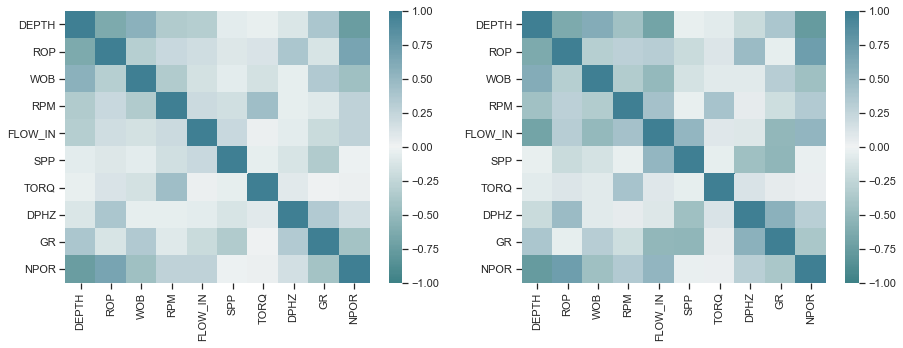

In [245]:
plt.figure(figsize = (15,5)) 
plt.subplot(1, 2, 1)  
sns.heatmap(df.corr(), vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(200, 220, n=200))

plt.subplot(1, 2, 2)  
sns.heatmap(clean_df.corr(), vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(200, 220, n=200))

# No significant differences in correlations for original and clean data

In [246]:
# Creating a separate dataframe for drilling parameters and and Well logs 

In [247]:
D_Parameters=clean_df[['DEPTH','ROP','WOB','RPM','FLOW_IN','SPP','TORQ']]

Well_logs= clean_df[['DEPTH','DPHZ','GR','NPOR']]

In [248]:
Well_logs.head()

,DEPTH,DPHZ,GR,NPOR
0,2182,0.1584,164.2335,0.1458
1,2183,0.1629,156.8428,0.2059
2,2184,0.1432,162.4369,0.1813
3,2186,0.1414,177.9345,0.0990
4,2188,0.1125,192.4346,0.1192


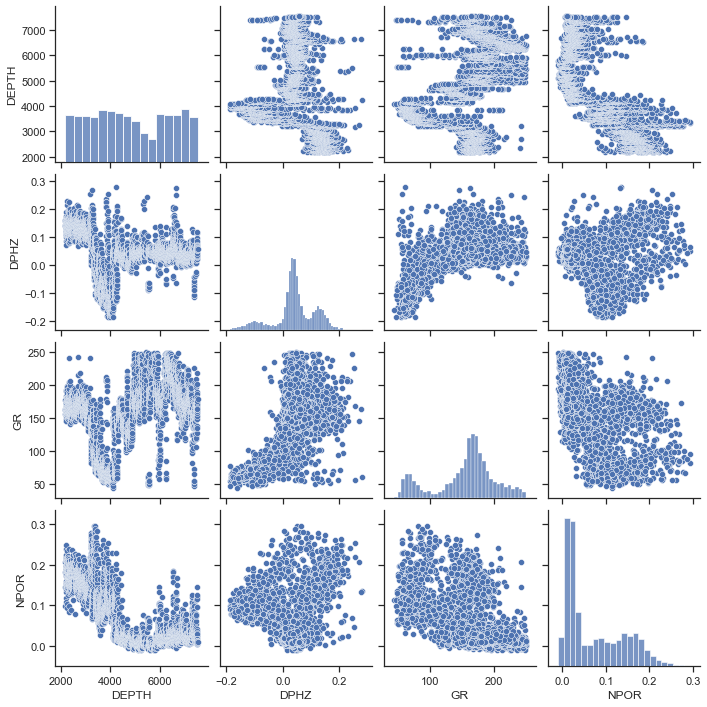

In [249]:
sns.set(style = 'ticks')
sns.pairplot(Well_logs)

In [250]:
D_Parameters.head()

,DEPTH,ROP,WOB,RPM,FLOW_IN,SPP,TORQ
0,2182,39.62,27.81,71.03,684.27,1063.55,103.64
1,2183,32.47,15.31,66.92,692.04,1065.43,138.44
2,2184,54.32,25.61,54.86,683.45,1065.16,143.06
3,2186,50.00,15.09,0.00,708.21,1067.48,39.78
4,2188,14.07,14.89,77.50,701.66,1064.21,149.23


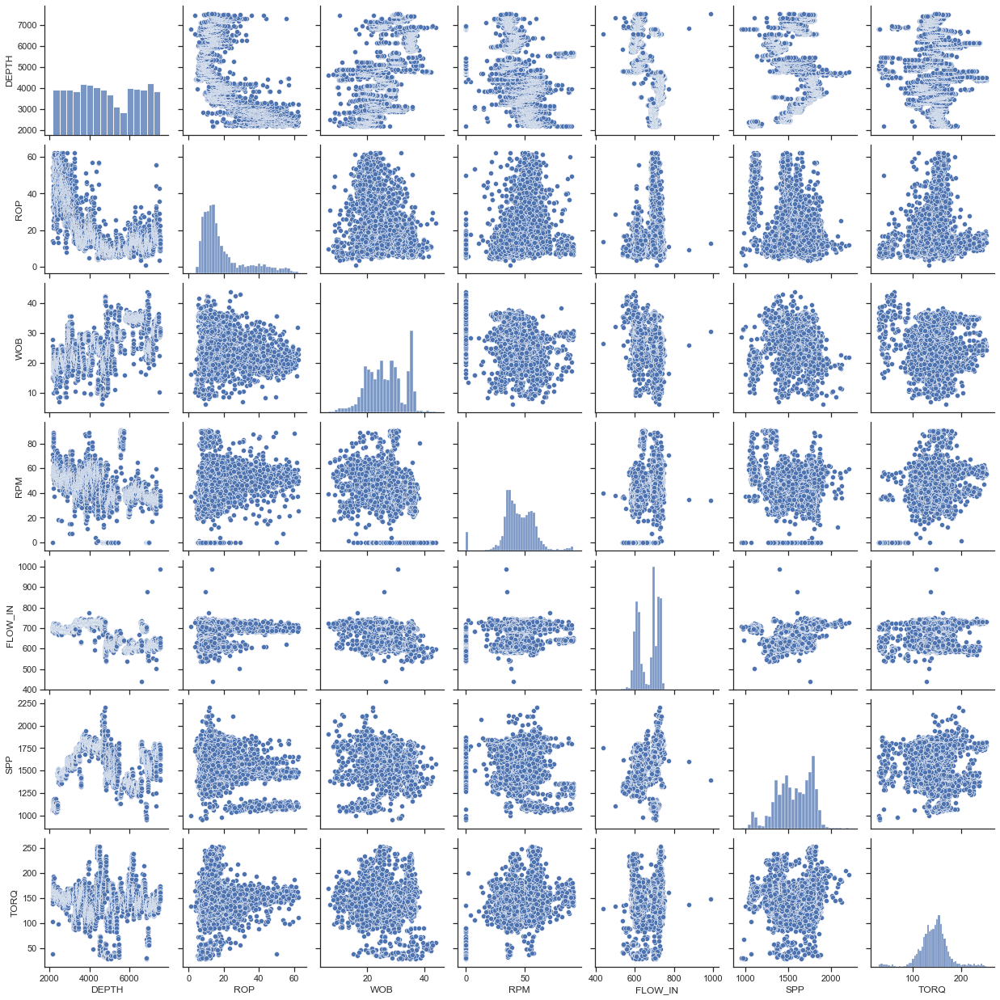

In [251]:
sns.set(style = 'ticks')
sns.pairplot(D_Parameters)

### SCALING DATA

### Scaling Drilling Data

In [514]:
D_Parameters[['RPM', 'WOB', 'FLOW_IN','SPP','TORQ', 'ROP']].head()

,RPM,WOB,FLOW_IN,SPP,TORQ,ROP
0,71.03,27.81,684.27,1063.55,103.64,39.62
1,66.92,15.31,692.04,1065.43,138.44,32.47
2,54.86,25.61,683.45,1065.16,143.06,54.32
3,0.00,15.09,708.21,1067.48,39.78,50.00
4,77.50,14.89,701.66,1064.21,149.23,14.07


In [252]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

input_DrillParam = D_Parameters[['RPM', 'WOB', 'FLOW_IN','SPP','TORQ']].to_numpy()                    
DrillParam_scaled = scaler.fit_transform(input_DrillParam)                              
DrillParam_scaled_df = pd.DataFrame (DrillParam_scaled, columns = ['RPM', 'WOB', 'FLOW_IN','SPP','TORQ']) 


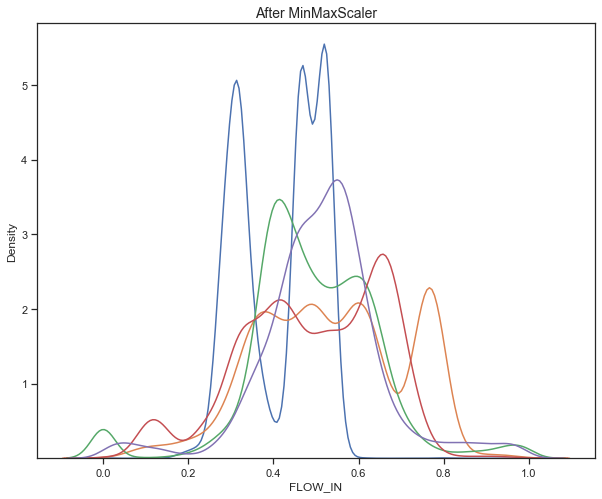

In [513]:
fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 8))
ax1.set_title('After MinMaxScaler', fontsize = 14)

sns.kdeplot(DrillParam_scaled_df['FLOW_IN'], ax=ax1)
sns.kdeplot(DrillParam_scaled_df['WOB'], ax=ax1)
sns.kdeplot(DrillParam_scaled_df['RPM'], ax=ax1)
sns.kdeplot(DrillParam_scaled_df['SPP'], ax=ax1)
sns.kdeplot(DrillParam_scaled_df['TORQ'], ax=ax1)

In [253]:
#DrillParam_scaled_df.head()

In [254]:
# Keep the output data separate and unsclaed
ROP_raw = D_Parameters[['ROP']].to_numpy() # Creating unscaled output as a separate numpy array
ROP_raw_df = pd.DataFrame(ROP_raw , columns = ['ROP'])# Converting it to a pandas dataframe
DrillParam_scaled_df['ROP'] = ROP_raw_df #adding the unscaled output (ROP) to the scaled input


In [255]:
DrillParam_scaled_df.head()

,RPM,WOB,FLOW_IN,SPP,TORQ,ROP
0,0.782872,0.572643,0.445431,0.091390,0.331690,39.62
1,0.737573,0.240637,0.459600,0.092893,0.487674,32.47
2,0.604651,0.514210,0.443936,0.092677,0.508382,54.32
3,0.000000,0.234794,0.489086,0.094531,0.045450,50.00
4,0.854183,0.229482,0.477142,0.091918,0.536038,14.07


In [256]:
DrillParam_scaled_df.isna().sum()

RPM        0
WOB        0
FLOW_IN    0
SPP        0
TORQ       0
ROP        0
dtype: int64

### Scaling Well Log Data

In [498]:
# Displaying well logs
Well_logs.head()

,DEPTH,DPHZ,GR,NPOR
0,2182,0.1584,164.2335,0.1458
1,2183,0.1629,156.8428,0.2059
2,2184,0.1432,162.4369,0.1813
3,2186,0.1414,177.9345,0.0990
4,2188,0.1125,192.4346,0.1192


In [502]:
#Defining logs for clustering 
well_log=Well_logs[['DPHZ','GR','NPOR']]


In [515]:
well_log.head()


,DPHZ,GR,NPOR
0,0.1584,164.2335,0.1458
1,0.1629,156.8428,0.2059
2,0.1432,162.4369,0.1813
3,0.1414,177.9345,0.0990
4,0.1125,192.4346,0.1192


In [ ]:
# Scaling using Minmax scaler

In [504]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

well_log_scaled = scaler.fit_transform(well_log)


well_log_scaled= pd.DataFrame(well_log_scaled, columns=['DPHZ','GR','NPOR'])

In [507]:
well_log_scaled.head()

,DPHZ,GR,NPOR
0,0.742434,0.583208,0.512821
1,0.752093,0.547252,0.710388
2,0.709809,0.574467,0.629520
3,0.705945,0.649864,0.358974
4,0.643915,0.720407,0.425378


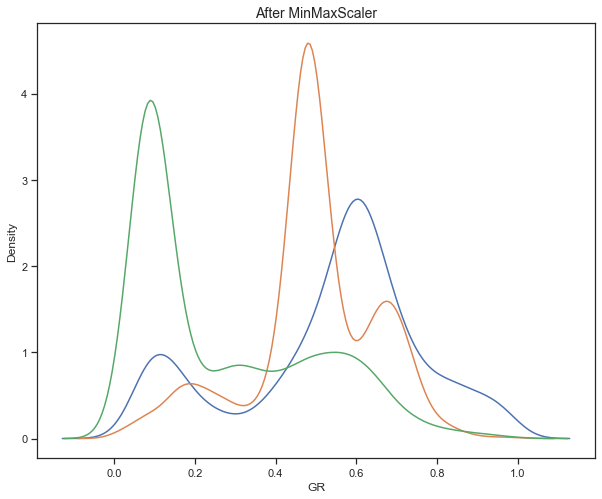

In [510]:
fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 8))
ax1.set_title('After MinMaxScaler', fontsize = 14)

sns.kdeplot(well_log_scaled['GR'], ax=ax1)
sns.kdeplot(well_log_scaled['DPHZ'], ax=ax1)
sns.kdeplot(well_log_scaled['NPOR'], ax=ax1)

# Construction Of Regression Model (Model 1)

1. The objective is to construct a regression model that predicts ROP using the drilling parameters.

K-Nearest Neighbours, Random Forest and Multilayer Perceptron (MLP) algorithms were used and compared  

In [257]:
from sklearn.model_selection import train_test_split
train , test = train_test_split(DrillParam_scaled_df, test_size = 0.15, random_state = 30 )

# splits the data into train and test data


In [258]:
# Nb- Axis=1 means column, axis=0 means rows.....DT is a colummn hence specified as axis=1

x_train = train.drop('ROP', axis=1) # Drop DT from the x-variables 
y_train = train['ROP']              # DT is the value being predicted, the y-variable

x_test = test.drop('ROP', axis = 1) # Do the same for the test set
y_test = test['ROP']

In [259]:
print("TRAINING DATA")
print("Size of x_train is:", x_train.shape)
print("Size of y_train is:", y_train.shape)
print("TEST DATA")
print("Size of x_test is:", x_test.shape)
print("Size of y_test is:", y_test.shape)

TRAINING DATA
Size of x_train is: (3765, 5)
Size of y_train is: (3765,)
TEST DATA
Size of x_test is: (665, 5)
Size of y_test is: (665,)


### REGRESSION WITH K-NEAREST NEIGHBOURS

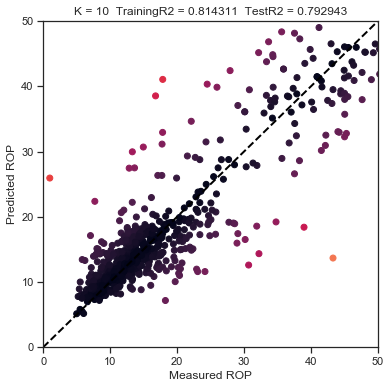

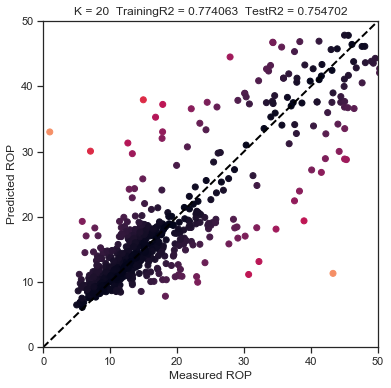

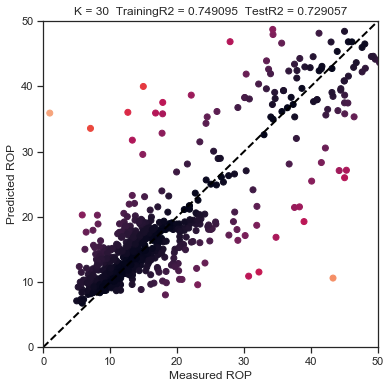

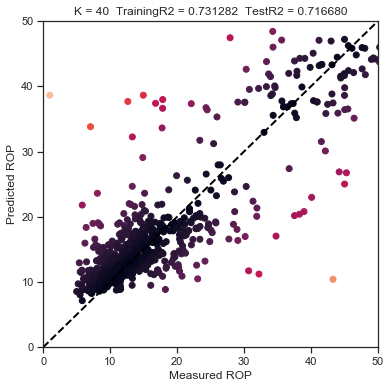

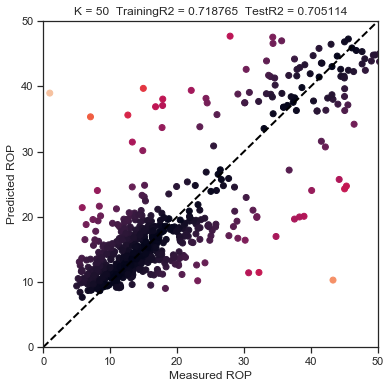

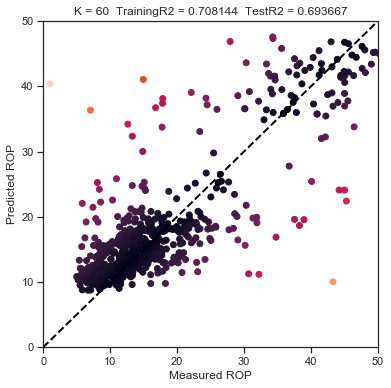

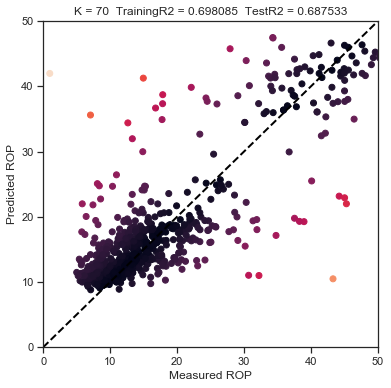

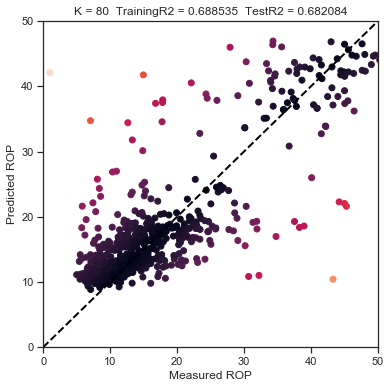

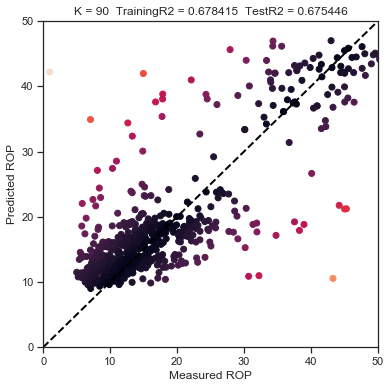

In [260]:
from sklearn import neighbors # importing K nearest neighbours
from sklearn.metrics import mean_squared_error # importing RMSE
from math import sqrt

rmse_val = [] # To store RMSE values for different k
k_val = []    # To store values of K or n_neighbors
R2 = []       # To store R2

for K in range(10, 100, 10): # Choosing k from 10 to 100 in increments of 10.

    k_val.append(K) # stores the value of k
    Trialmodel1 = neighbors.KNeighborsRegressor(n_neighbors = K)

    Trialmodel1.fit(x_train, y_train)  # fitting the model to the defined training data
    y_pred = Trialmodel1.predict(x_test) #Predicting ROP for the test data
    
    training_R2 = Trialmodel1.score(x_train, y_train) # Computing training R2 (correlation co-efficient for training data)
    test_R2 = Trialmodel1.score(x_test, y_test)       # Computing test R2
    R2.append(test_R2)
    
    error = sqrt(mean_squared_error(y_test, y_pred)) #calculating the Root Mean Squared Error
    rmse_val.append(error)                         #Storing the RMSE values
    er=abs(y_test - y_pred)  
   
    # A plot of predicted and actual ROP values for different number of neighbors (K-values)
    fig = plt.figure(K, figsize=(6, 6))
    plt.axis([0, 50, 0, 50])
    plt.scatter(y_test, y_pred, c = er)
    plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
    plt.ylabel('Predicted ROP') # Predicted values on y axis
    plt.xlabel('Measured ROP') 
    plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%(K, training_R2, test_R2))

In [480]:
 print(rmse_val)

[5.940633285904289, 6.465987120675145, 6.795579049650598, 6.949065778004268, 7.089488564185309, 7.225782421825374, 7.297767683180926, 7.361119497275668, 7.437579257413231]


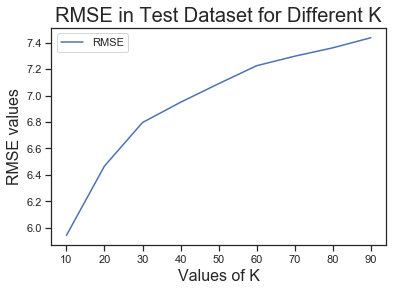

In [261]:
#plotting the rmse values against k values
plt.plot(k_val, rmse_val, label = 'RMSE')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('RMSE values', fontsize = 16)
plt.title ('RMSE in Test Dataset for Different K', fontsize = 20)
plt.legend()


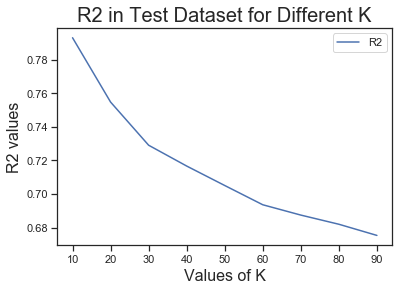

In [262]:
#plotting the test R2 values against K 
plt.plot(k_val, R2, label = 'R2')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('R2 values', fontsize = 16)
plt.title ('R2 in Test Dataset for Different K', fontsize = 20)
plt.legend()

In [52]:
# optimal k is 10 which slightly overfits the data but there is no significant difference between training R2 and test R2
#Trying out KNN with cross-validation

### KNN WITH CROSS-VALIDATION

In [263]:
 Trialmodel2 = neighbors.KNeighborsRegressor(n_neighbors = 5)
# defining an arbitrary model

In [264]:
from sklearn.model_selection import KFold

cv = KFold(n_splits=5, shuffle = True, random_state=125)

In [516]:
from sklearn.model_selection import GridSearchCV

param_grid = { 'n_neighbors': [10, 20, 30], 'weights': ['uniform', 'distance'], 'metric':['euclidean','manhattan','minkowski']}


grid = GridSearchCV(Trialmodel2, param_grid=param_grid, cv=cv, verbose=3)

In [517]:
grid.fit(x_train, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 2/5] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 3/5] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 4/5] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 5/5] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 1/5] END metric=euclidean, n_neighbors=10, weights=distance; total time=   0.0s
[CV 2/5] END metric=euclidean, n_neighbors=10, weights=distance; total time=   0.0s
[CV 3/5] END metric=euclidean, n_neighbors=10, weights=distance; total time=   0.0s
[CV 4/5] END metric=euclidean, n_neighbors=10, weights=distance; total time=   0.0s
[CV 5/5] END metric=euclidean, n_neighbors=10, weights=distance; total time=   0.0s
[CV 1/5] END metric=euclidean, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 2/5] END metric=e

GridSearchCV(cv=KFold(n_splits=5, random_state=125, shuffle=True),
             estimator=KNeighborsRegressor(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': [10, 20, 30],
                         'weights': ['uniform', 'distance']},
             verbose=3)

In [521]:
#print(grid.cv_results_)


In [522]:
cv_results = pd.DataFrame(grid.cv_results_)

In [ ]:
# sortung cross-validation results

In [523]:
cv_results_slct=cv_results[['param_n_neighbors','param_weights','param_metric','mean_test_score']] #add mean_test_score to data
cv_results_slct.sort_index(by='mean_test_score', ascending=False).head(5) # ranking the best parameters based on thier scores

,param_n_neighbors,param_weights,param_metric,mean_test_score
7,10,distance,manhattan,0.799327
1,10,distance,euclidean,0.790464
13,10,distance,minkowski,0.790464
9,20,distance,manhattan,0.790006
11,30,distance,manhattan,0.778225


In [524]:
grid.best_estimator_

KNeighborsRegressor(metric='manhattan', n_neighbors=10, weights='distance')

In [525]:
grid.best_params_

{'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'distance'}

In [526]:
# Creating a model with the best estimator

KNNtrial_model=grid.best_estimator_


In [527]:
KNNtrial_model_ypred=KNNtrial_model.predict(x_test)
KNNtrial_model_test_R2 = KNNtrial_model.score(x_test, y_test)
print("R2 = ", KNNtrial_model_test_R2)

R2 =  0.8329864585707711


In [528]:
#print(KNNtrial_model_ypred)

Text(0.5, 1.0, 'TestR2 = 0.832986')

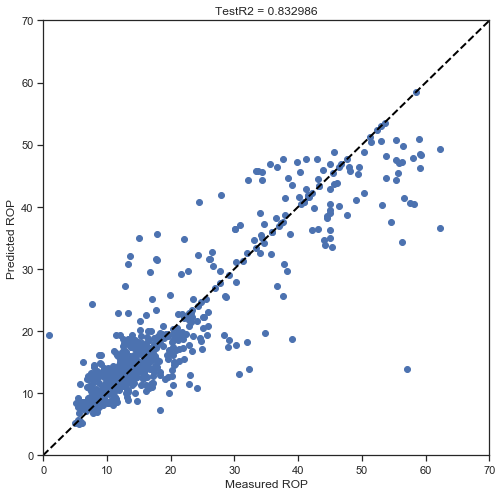

In [529]:
# Plotting predicted vs actual ROP values for the best estimator
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0, 70, 0, 70])
plt.scatter(y_test, KNNtrial_model_ypred)
plt.plot([0,160],[0,160],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted ROP') # 
plt.xlabel('Measured ROP') 
plt.title('TestR2 = %f'%(KNNtrial_model_test_R2))

In [530]:
KNNtrial_model_error = sqrt(mean_squared_error(y_test, KNNtrial_model_ypred))

In [531]:
print('cross_val KNNbest estimator Training R2 is', 0.799327 )
print('cross_val KNNbest estimator Test R2 is', KNNtrial_model_test_R2 )
print('cross_val KNNbest estimator RMSE is', KNNtrial_model_error  )

cross_val KNNbest estimator Training R2 is 0.799327
cross_val KNNbest estimator Test R2 is 0.8329864585707711
cross_val KNNbest estimator RMSE is 5.335360158083592


In [279]:
# KNN best model after cross validation looks promising in predicting ROP with appreciable R2 and RMSE values

### REGRESSION WITH RANDOM FOREST

In [280]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 


RandFst = RandomForestRegressor(n_estimators=100, max_depth=4) # Random Forest model with random hyperparameters


In [281]:
# Going ahead to conduct cross-validation to get a best estimator 

In [282]:
rfcv = KFold(n_splits=10, shuffle = True, random_state=400)


In [283]:
param_grid_rf = { 'bootstrap': [True], 'max_depth': [3,4,5,6], 'min_samples_split': [5,10,15],'max_samples': [2000, 3000, 4000, 5000], 'n_estimators': [100, 500, 1000]}
# dictionary with keys

grid_rf = GridSearchCV(RandFst, param_grid=param_grid_rf, cv=rfcv, verbose=3)

In [284]:
grid_rf.fit(x_train, y_train)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
[CV 1/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV 2/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV 3/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV 4/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV 5/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV 6/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV 7/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV 8/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100; to

[CV 9/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=15, n_estimators=100; total time=   0.2s
[CV 10/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=15, n_estimators=100; total time=   0.2s
[CV 1/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.4s
[CV 2/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.8s
[CV 3/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.4s
[CV 4/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.3s
[CV 5/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.4s
[CV 6/10] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.4s
[CV 7/10] END bootstrap=True, max_depth

[CV 8/10] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=500; total time=   1.5s
[CV 9/10] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=500; total time=   1.5s
[CV 10/10] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=500; total time=   1.5s
[CV 1/10] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   3.8s
[CV 2/10] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   3.7s
[CV 3/10] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   4.6s
[CV 4/10] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   3.3s
[CV 5/10] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   3.9s
[CV 6/10] END bootstrap=True, max_

[CV 4/10] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 5/10] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 6/10] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 7/10] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 8/10] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 9/10] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 10/10] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 1/10] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=1000; total time=   0.0s
[CV 2/10] END bootstrap=True, max_dept

[CV 1/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV 2/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV 3/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV 4/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV 5/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV 6/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV 7/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV 8/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV 9/10] END bootstrap=True, max_depth=4, max_s

[CV 10/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=15, n_estimators=100; total time=   0.2s
[CV 1/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.7s
[CV 2/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.5s
[CV 3/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.6s
[CV 4/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.5s
[CV 5/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.5s
[CV 6/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.9s
[CV 7/10] END bootstrap=True, max_depth=4, max_samples=2000, min_samples_split=15, n_estimators=500; total time=   1.6s
[CV 8/10] END bootstrap=True, max_depth

[CV 9/10] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=10, n_estimators=500; total time=   2.6s
[CV 10/10] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=10, n_estimators=500; total time=   2.4s
[CV 1/10] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   4.8s
[CV 2/10] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   5.5s
[CV 3/10] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   4.4s
[CV 4/10] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   5.1s
[CV 5/10] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   4.8s
[CV 6/10] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   4.6s
[CV 7/10] END bootstrap=True, max

[CV 5/10] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 6/10] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 7/10] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 8/10] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 9/10] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 10/10] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 1/10] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 2/10] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 3/10] END bootstrap=True, max

[CV 9/10] END bootstrap=True, max_depth=4, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 10/10] END bootstrap=True, max_depth=4, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 1/10] END bootstrap=True, max_depth=4, max_samples=5000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 2/10] END bootstrap=True, max_depth=4, max_samples=5000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 3/10] END bootstrap=True, max_depth=4, max_samples=5000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 4/10] END bootstrap=True, max_depth=4, max_samples=5000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 5/10] END bootstrap=True, max_depth=4, max_samples=5000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 6/10] END bootstrap=True, max_depth=4, max_samples=5000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 7/10] END bootstrap=True, max_depth

[CV 8/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.7s
[CV 9/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.2s
[CV 10/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.6s
[CV 1/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=10, n_estimators=1000; total time=   4.6s
[CV 2/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=10, n_estimators=1000; total time=   4.2s
[CV 3/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=10, n_estimators=1000; total time=   4.3s
[CV 4/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=10, n_estimators=1000; total time=   4.2s
[CV 5/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=10, n_estimators=1000; total time=   4.0s
[CV 6/10] END bootstrap=True, max_

[CV 7/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   7.6s
[CV 8/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   6.2s
[CV 9/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   6.9s
[CV 10/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   6.0s
[CV 1/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV 2/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV 3/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV 4/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV 5/10] END bootstrap=True, max_depth

[CV 10/10] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 1/10] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 2/10] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 3/10] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 4/10] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 5/10] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 6/10] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 7/10] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=1000; total time=   0.0s
[CV 8/10] END bootstrap=True, ma

[CV 4/10] END bootstrap=True, max_depth=5, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 5/10] END bootstrap=True, max_depth=5, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 6/10] END bootstrap=True, max_depth=5, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 7/10] END bootstrap=True, max_depth=5, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 8/10] END bootstrap=True, max_depth=5, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 9/10] END bootstrap=True, max_depth=5, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 10/10] END bootstrap=True, max_depth=5, max_samples=5000, min_samples_split=15, n_estimators=100; total time=   0.0s
[CV 1/10] END bootstrap=True, max_depth=5, max_samples=5000, min_samples_split=15, n_estimators=500; total time=   0.0s
[CV 2/10] END bootstrap=True, max_depth

[CV 3/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.2s
[CV 4/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   3.3s
[CV 5/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.4s
[CV 6/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.4s
[CV 7/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.9s
[CV 8/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.5s
[CV 9/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.1s
[CV 10/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.1s
[CV 1/10] END bootstrap=True, max_depth

[CV 2/10] END bootstrap=True, max_depth=6, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   7.1s
[CV 3/10] END bootstrap=True, max_depth=6, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   7.3s
[CV 4/10] END bootstrap=True, max_depth=6, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   6.9s
[CV 5/10] END bootstrap=True, max_depth=6, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   7.1s
[CV 6/10] END bootstrap=True, max_depth=6, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   7.6s
[CV 7/10] END bootstrap=True, max_depth=6, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   7.1s
[CV 8/10] END bootstrap=True, max_depth=6, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   7.7s
[CV 9/10] END bootstrap=True, max_depth=6, max_samples=3000, min_samples_split=5, n_estimators=1000; total time=   6.0s
[CV 10/10] END bootstrap=True, max_depth

[CV 10/10] END bootstrap=True, max_depth=6, max_samples=4000, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV 1/10] END bootstrap=True, max_depth=6, max_samples=4000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 2/10] END bootstrap=True, max_depth=6, max_samples=4000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 3/10] END bootstrap=True, max_depth=6, max_samples=4000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 4/10] END bootstrap=True, max_depth=6, max_samples=4000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 5/10] END bootstrap=True, max_depth=6, max_samples=4000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 6/10] END bootstrap=True, max_depth=6, max_samples=4000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 7/10] END bootstrap=True, max_depth=6, max_samples=4000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 8/10] END bootstrap=True, max_depth

[CV 8/10] END bootstrap=True, max_depth=6, max_samples=5000, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV 9/10] END bootstrap=True, max_depth=6, max_samples=5000, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV 10/10] END bootstrap=True, max_depth=6, max_samples=5000, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV 1/10] END bootstrap=True, max_depth=6, max_samples=5000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 2/10] END bootstrap=True, max_depth=6, max_samples=5000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 3/10] END bootstrap=True, max_depth=6, max_samples=5000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 4/10] END bootstrap=True, max_depth=6, max_samples=5000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 5/10] END bootstrap=True, max_depth=6, max_samples=5000, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV 6/10] END bootstrap=True, max_depth

GridSearchCV(cv=KFold(n_splits=10, random_state=400, shuffle=True),
             estimator=RandomForestRegressor(max_depth=4),
             param_grid={'bootstrap': [True], 'max_depth': [3, 4, 5, 6],
                         'max_samples': [2000, 3000, 4000, 5000],
                         'min_samples_split': [5, 10, 15],
                         'n_estimators': [100, 500, 1000]},
             verbose=3)

In [285]:
grid_rfcv_results = pd.DataFrame(grid_rf.cv_results_)
#grid_rfcv_results.head(5)

In [485]:
grid_rfcv_results_slct=grid_rfcv_results[['param_max_depth','param_min_samples_split','param_n_estimators','param_max_samples','mean_test_score']] #add mean_test_score to data
grid_rfcv_results_slct.sort_index(by='mean_test_score', ascending=False).head(5)

,param_max_depth,param_min_samples_split,param_n_estimators,param_max_samples,mean_test_score
110,6,5,1000,2000,0.737286
109,6,5,500,2000,0.737044
111,6,10,100,2000,0.736531
117,6,5,100,3000,0.736343
112,6,10,500,2000,0.736200


In [287]:
print(grid_rf.best_params_)
print(grid_rf.best_estimator_) # showing the parameters of the best random forest regression model 

{'bootstrap': True, 'max_depth': 6, 'max_samples': 2000, 'min_samples_split': 5, 'n_estimators': 1000}
RandomForestRegressor(max_depth=6, max_samples=2000, min_samples_split=5,
                      n_estimators=1000)


In [288]:
rfTrialMod=grid_rf.best_estimator_

In [289]:
rfTrialMod_ypred=rfTrialMod.predict(x_test)
rfTrialMod_R2 = rfTrialMod.score(x_test, y_test)
print("R2 = ", rfTrialMod_R2)

R2 =  0.7512556112977881


Text(0.5, 1.0, 'TestR2 = 0.751256')

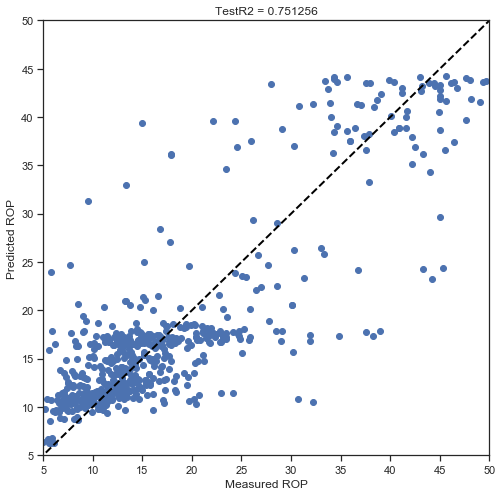

In [290]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([5, 50, 5, 50])
plt.scatter(y_test, rfTrialMod_ypred)
plt.plot([0,160],[0,160],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted ROP') 
plt.xlabel('Measured ROP') 
plt.title('TestR2 = %f'%(rfTrialMod_R2))

In [291]:
 e_rror = sqrt(mean_squared_error(y_test, rfTrialMod_ypred))

In [481]:
print('RandomForest CV best_estimator Training R2 is', 0.737286 )
print('RandomForest CV best_estimator Test R2 is', rfTrialMod_R2) 
print('cross_val RFbest estimator RMSE is', e_rror )

RandomForest CV best_estimator Training R2 is 0.737286
RandomForest CV best_estimator Test R2 is 0.7512556112977881
cross_val RFbest estimator RMSE is 6.5112526180290295


In [293]:
#Finding Important Parameters

In [294]:
importances = list(rfTrialMod.feature_importances_)


In [295]:
feature_list=list(D_Parameters[['WOB','RPM','FLOW_IN','TORQ','SPP']].columns)

feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: TORQ                 Importance: 0.53
Variable: FLOW_IN              Importance: 0.32
Variable: SPP                  Importance: 0.06
Variable: RPM                  Importance: 0.05
Variable: WOB                  Importance: 0.03


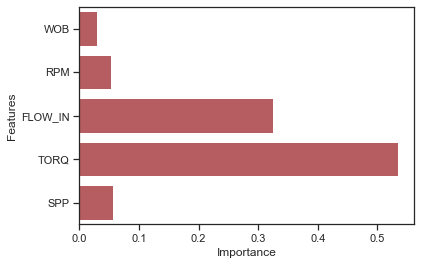

In [296]:
feature_dataframe = pd.DataFrame(data = feature_list, columns = ['Features'])
feature_dataframe['Importance'] = importances

sns.set(style = 'ticks')
sns.barplot(x = 'Importance', y = 'Features', data = feature_dataframe, color="r")

In [297]:
# Torque and mudlfowrate are the best predicting parameters
# conducting randomforest with Torque  and Mudflowrate as the only input features

In [298]:
Param_best=DrillParam_scaled_df[['FLOW_IN', 'TORQ', 'ROP']]

In [299]:
#Param_best.head()

In [300]:
from sklearn.model_selection import train_test_split
train1 , test1 = train_test_split(Param_best, test_size = 0.15, random_state = 30)

In [301]:

x1_train = train1.drop('ROP', axis=1) # Drop DT from the x-variables 
y1_train = train1['ROP']              # DT is the value being predicted, the y-variable

x1_test = test1.drop('ROP', axis = 1) # Do the same for the test set
y1_test = test1['ROP']

In [302]:
rfTrialMod_bestP=rfTrialMod

In [303]:
rfTrialMod_bestP.fit(x1_train, y1_train)

RandomForestRegressor(max_depth=6, max_samples=2000, min_samples_split=5,
                      n_estimators=1000)

In [533]:
ImpFeatures_R2 = rfTrialMod_bestP.score(x1_train, y1_train)

print(ImpFeatures_R2)

0.6136395601027733


In [304]:
rfTrialMod_bestP_ypred=rfTrialMod_bestP.predict(x1_test)
rrfTrialMod_bestP_R2 = rfTrialMod_bestP.score(x1_test, y1_test)
print("R2 = ", rrfTrialMod_bestP_R2)

R2 =  0.5568998447482179


In [144]:
# The  R2 values for training and testing were unexpectedly low. This could mean that other input features 
#contributed appreciably in ROP prediction 

#### MLP REGRESSOR

In [442]:
from sklearn.model_selection import KFold
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor

NN_Reg= MLPRegressor(hidden_layer_sizes=100, max_iter=100, random_state=1)

In [443]:
cv_nn = KFold(n_splits=5, shuffle = True, random_state=125)

In [453]:

from sklearn.model_selection import GridSearchCV
param_grid_nn = {'hidden_layer_sizes': [10, 20, 30],'solver':['lbfgs','sgd', 'adam'],'activation': ['identity', 'tanh', 'relu'], 'max_iter': [100,200,300]}
# dictionary with keys

grid_nn = GridSearchCV(NN_Reg, param_grid=param_grid_nn , cv=cv_nn , verbose=3)

In [454]:
grid_nn.fit(x_train, y_train)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV 1/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 2/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 3/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 4/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 5/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 1/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.4s
[CV 2/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.2s
[CV 3/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.3s
[CV 4/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.2s
[CV 5/5] E

[CV 1/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.4s
[CV 2/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.4s
[CV 3/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.3s
[CV 4/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.2s
[CV 5/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.4s
[CV 1/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.5s
[CV 2/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.6s
[CV 3/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.4s
[CV 4/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.3s
[CV 5/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=

[CV 2/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   1.1s
[CV 3/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   1.1s
[CV 4/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   1.1s
[CV 5/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   1.6s
[CV 1/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.2s
[CV 2/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.2s
[CV 3/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.3s
[CV 4/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.2s
[CV 5/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.2s
[CV 1/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=sgd; total time=   1.5s
[CV 2/

[CV 5/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=lbfgs; total time=   0.3s
[CV 1/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.4s
[CV 2/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.8s
[CV 3/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.5s
[CV 4/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.5s
[CV 5/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.4s
[CV 1/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=adam; total time=   1.6s
[CV 2/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=adam; total time=   1.7s
[CV 3/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=adam; total time=   1.6s
[CV 4/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=adam; total time=   1.6s
[CV 5/5] END a

[CV 3/5] END activation=relu, hidden_layer_sizes=20, max_iter=100, solver=adam; total time=   0.5s
[CV 4/5] END activation=relu, hidden_layer_sizes=20, max_iter=100, solver=adam; total time=   0.6s
[CV 5/5] END activation=relu, hidden_layer_sizes=20, max_iter=100, solver=adam; total time=   0.5s
[CV 1/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 2/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.3s
[CV 3/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 4/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 5/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 1/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=sgd; total time=   0.9s
[CV 2/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=sgd; total time=   0.9s
[CV 3/5

GridSearchCV(cv=KFold(n_splits=5, random_state=125, shuffle=True),
             estimator=MLPRegressor(hidden_layer_sizes=100, max_iter=100,
                                    random_state=1),
             param_grid={'activation': ['identity', 'tanh', 'relu'],
                         'hidden_layer_sizes': [10, 20, 30],
                         'max_iter': [100, 200, 300],
                         'solver': ['lbfgs', 'sgd', 'adam']},
             verbose=3)

In [455]:
grid_nncv_results = pd.DataFrame(grid_nn.cv_results_)

In [456]:
grid_nncv_results_slct=grid_nncv_results[['param_hidden_layer_sizes','param_solver','param_activation','param_max_iter','mean_test_score']] #add mean_test_score to data
grid_nncv_results_slct.sort_index(by='mean_test_score', ascending=False).head(5)

,param_hidden_layer_sizes,param_solver,param_activation,param_max_iter,mean_test_score
51,30,lbfgs,tanh,300,0.677123
42,20,lbfgs,tanh,300,0.654853
48,30,lbfgs,tanh,200,0.644103
39,20,lbfgs,tanh,200,0.630544
45,30,lbfgs,tanh,100,0.605601


In [457]:
grid_nn.best_estimator_

MLPRegressor(activation='tanh', hidden_layer_sizes=30, max_iter=300,
             random_state=1, solver='lbfgs')

In [458]:
ANNbest=grid_nn.best_estimator_

ANNbest_ypred=ANNbest.predict(x_test)
ANNbest_R2 = ANNbest.score(x_test, y_test)
print("R2 = ", ANNbest_R2 )

R2 =  0.6777355044331483


Text(0.5, 1.0, 'TestR2 = 0.677736')

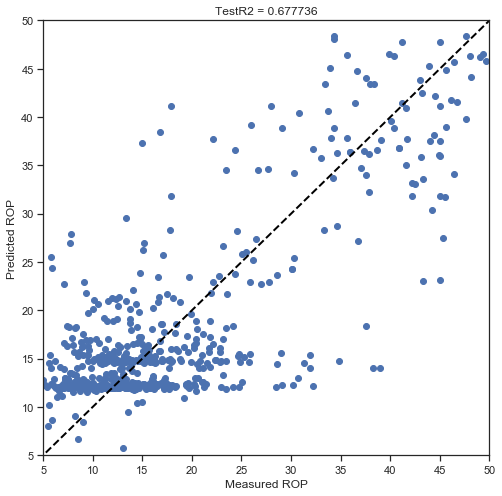

In [459]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([5, 50, 5, 50])
plt.scatter(y_test, ANNbest_ypred)
plt.plot([0,160],[0,160],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted ROP') # Predicted values on y axis
plt.xlabel('Measured ROP') 
plt.title('TestR2 = %f'%(ANNbest_R2))

In [482]:
ann_error=sqrt(mean_squared_error(y_test, ANNbest_ypred))

In [484]:
print('ANN CV_best_estimator Training R2 is', 0.677123 )
print('ANN CV_best_estimator Test R2 is', ANNbest_R2) 
print('ANN CV_best_estimator RMSE is', ann_error )

ANN CV_best_estimator Training R2 is 0.677123
ANN CV_best_estimator Test R2 is 0.6777355044331483
ANN CV_best_estimator RMSE is 7.411295496319837


In [ ]:
#MLP did not perform as well as KNN and Random Forest

## CONCLUSION (MODEL 1 DEVELOPMENT)

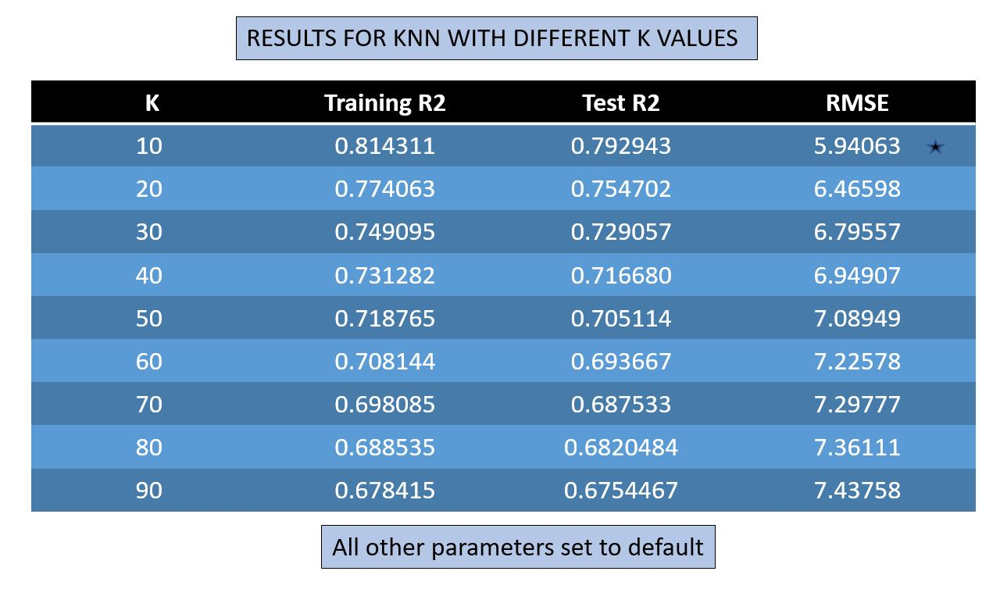

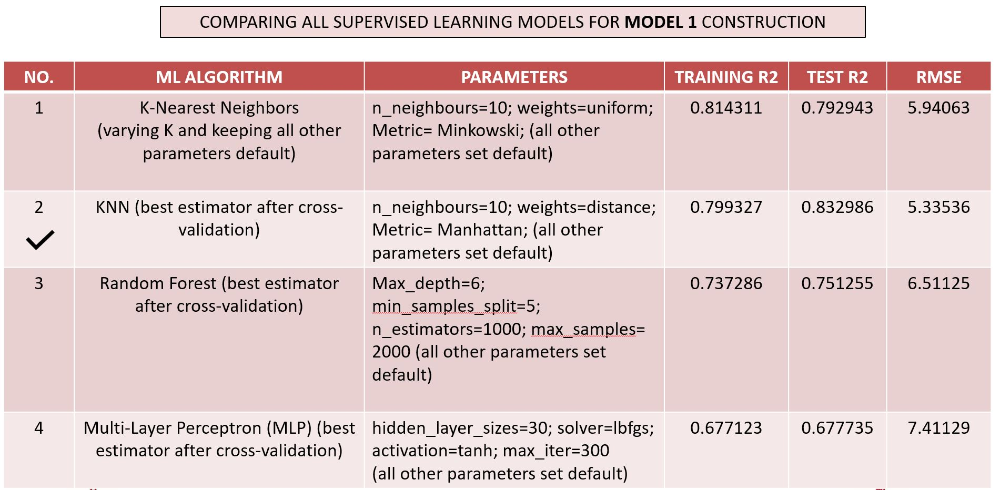

In [491]:
# Option 2 is chosen as the best model for MODEL 1 as checked 

# Construction Of Classification Model 

1. The objective is to construct a unspupervised classification model classifies the data points into lithologies (Facies) using well logs
   KMeans and Hierarchical clustering would be employed 

### KMEANS CLUSTERING

In [508]:
log_kmeans = KMeans(n_clusters = 3, init = 'k-means++', n_init = 10, max_iter = 300, random_state=150)
Electrofacies_kmeans = log_kmeans.fit_predict(well_log_scaled)


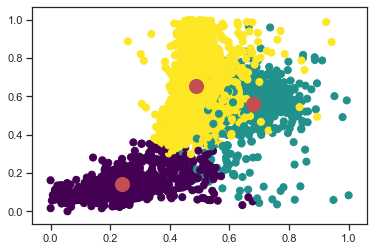

In [509]:
plt.scatter(well_log_scaled.iloc[:, 0], well_log_scaled.iloc[:, 1], c=Electrofacies_kmeans, s=50, cmap='viridis')

plt.scatter(log_kmeans.cluster_centers_[:, 0], log_kmeans.cluster_centers_[:, 1], c='r', s=200);

In [344]:
#Redifining the original data for labelling purposes
K_labelled_Data=clean_df

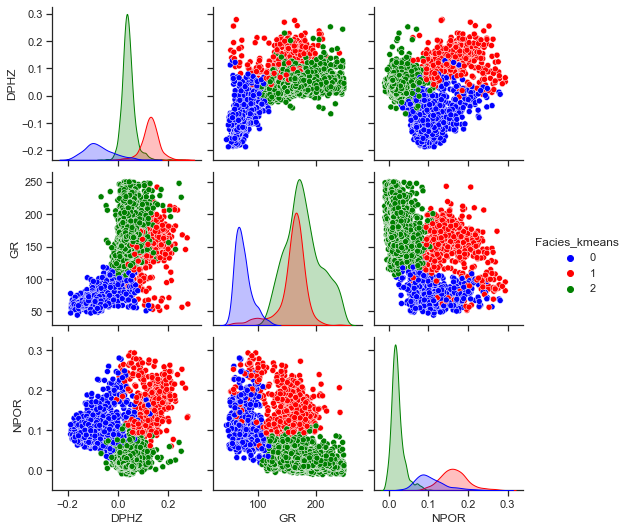

In [345]:
K_labelled_Data['Facies_kmeans'] = Electrofacies_kmeans

sns.set(style = 'ticks') # Set the background to dark
sns.pairplot(K_labelled_Data, vars=['DPHZ','GR', 'NPOR'] ,hue = 'Facies_kmeans', palette=['blue','red','green'])

In [346]:
K_labelled_Data.isna().sum()

DEPTH            0
ROP              0
WOB              0
RPM              0
FLOW_IN          0
SPP              0
TORQ             0
DPHZ             0
GR               0
NPOR             0
Facies_kmeans    0
Facies_HC        0
dtype: int64

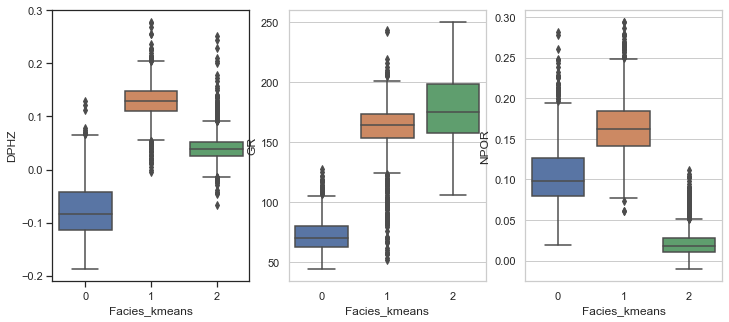

In [347]:
plt.figure(figsize = (12,5)) 
plt.subplot(1, 3, 1)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['DPHZ'])

plt.subplot(1, 3, 2)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['GR'])

plt.subplot(1, 3, 3)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['NPOR'])

In [348]:
# Scatterplots shows pretty good clusters for Kmeans,
# This is confirmed by the boxplots

1. Label 0= has fairly low DPHZ and NPOR porosity values, and very high GR values (probably a shaly or a high radioactive zone)
2. Label 1= has relatively lower DPHZ porosity values compared to Label 0 but higher NPOR porosity values. It has the lowest GR measurements.
3. Label 2= has fairly high NPOR and DPHZ porosity values as well as GR values, suggesting a good porous formation

In [349]:
# checking optimum number of clusters 

In [350]:
SSW = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_optimal = KMeans(n_clusters = k, random_state=20).fit(well_log_scaled) # All the other K-Means options are defaulted
    
    SSW[k] =   kmeans_optimal .inertia_ # Compute the sum of squares within

#inertia is the sum of square within
print('The SSW values are', SSW[1:10])

The SSW values are [565.40407372 321.51282894 140.25092685 100.5542595   79.48036443
  66.14016006  58.86796228  53.80059911  49.55545223]


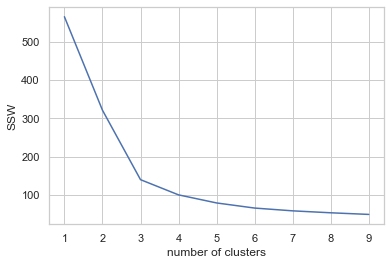

In [351]:
clusters = range(1, 10)
plt.ylabel('SSW')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW[1:10])     

#optimal clusters is 3 

VISULAIZING CLUSTERS ON LOGS AGAINST DEPTHS

In [352]:
def log_plot(logs):
    from matplotlib.patches import Patch
    logs = logs.sort_values(by='DEPTH')
    top = logs.DEPTH.min()
    bot = logs.DEPTH.max()
    
    f, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 10))
    ax[0].plot(logs.GR, logs.DEPTH, color='green')
    ax[1].plot(logs.DPHZ, logs.DEPTH, color='red')
    ax[2].plot(logs.NPOR, logs.DEPTH, color='blue')

    
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 0,color = 'blue')
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 1,color = 'red')
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 2,color = 'green')

    
    for i in range(len(ax)):
        ax[i].set_ylim(top,bot)
        ax[i].invert_yaxis()
        ax[i].grid()
        
    ax[0].set_xlabel("GR", fontsize = 16)
    ax[0].set_xlim(logs.GR.min(),logs.GR.max())
    ax[0].set_ylabel("Depth(ft)",fontsize = 16)
    ax[1].set_xlabel("DPHZ", fontsize = 16)
    ax[1].set_xlim(logs.DPHZ.min(),logs.DPHZ.max())
    ax[2].set_xlabel("NPOR", fontsize = 16)
    ax[2].set_xlim(logs.NPOR.min(),logs.NPOR.max())
    
    ax[3].set_xlabel("Facies", fontsize = 16)
#    ax[3].set_xlim(logs.Facies.min(),logs.Facies.max())
    
    ax[1].set_yticklabels([]); ax[2].set_yticklabels([]);
    ax[3].set_yticklabels([]); 
    legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='0'),
                       Patch(facecolor='red', edgecolor='red',   label='1'),
                       Patch(facecolor='green', edgecolor='green', label='2')]
    ax[3].legend(handles=legend_elements, loc='upper left')
    
    f.suptitle('Well5832', fontsize=20,y=0.94)

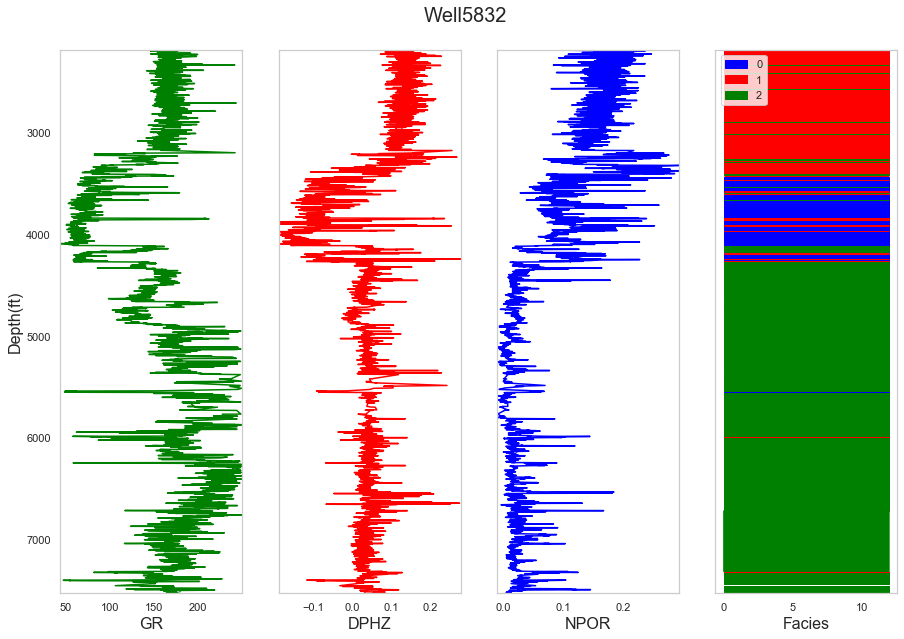

In [353]:
log_plot(K_labelled_Data)

1. From 0 to about 3000ft is predominantly Facies O
2. Between about 3000ft to 4000ft is predominantly Facies 1
3. And between 3000 to about 7500ft is predominantly Facies 3

In [354]:
# Checking the performance of Hierarchichal Clustering

### HIERARCHICAL CLUSTERING

In [355]:
# Aglomerative clustering with 'complete linkage'

In [356]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

In [488]:
log_HC = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'ward')

Electrofacies_HC = log_HC.fit_predict(well_log_scaled)

print(log_HC .labels_)

[1 1 1 ... 0 0 0]


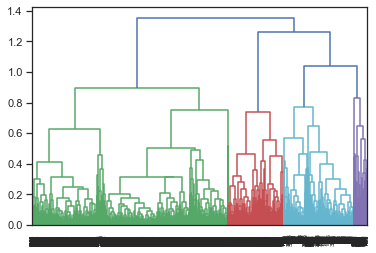

In [489]:
dendrogram = sch.dendrogram(sch.linkage(well_log_scaled, method='complete'))

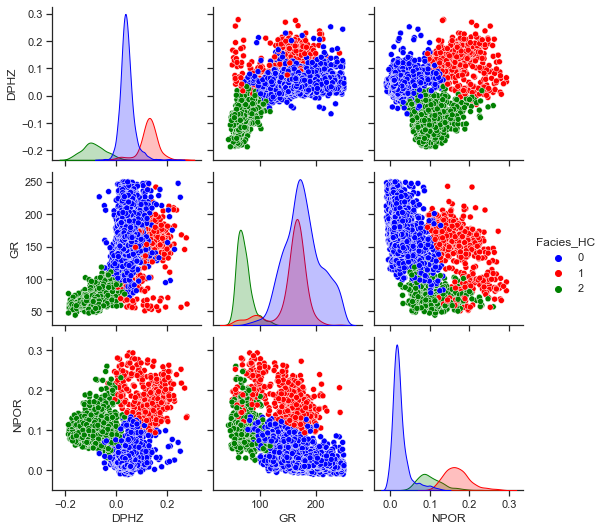

In [490]:
K_labelled_Data['Facies_HC'] = Electrofacies_HC

sns.set(style = 'ticks') # Set the background to dark
sns.pairplot(K_labelled_Data, vars=['DPHZ','GR', 'NPOR'] ,hue = 'Facies_HC', palette=['blue','red','green'])

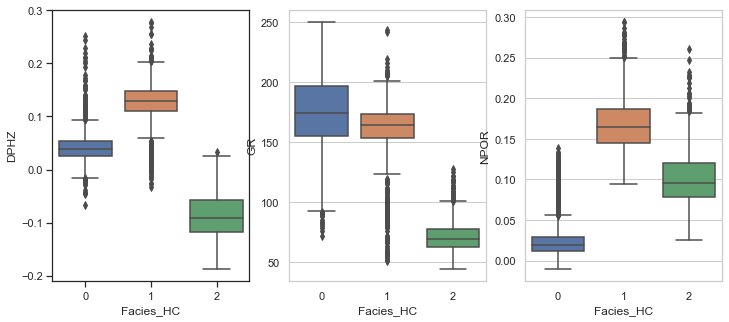

In [359]:
plt.figure(figsize = (12,5)) 
plt.subplot(1, 3, 1)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_HC'], y=K_labelled_Data['DPHZ'])

plt.subplot(1, 3, 2)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_HC'], y=K_labelled_Data['GR'])

plt.subplot(1, 3, 3)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_HC'], y=K_labelled_Data['NPOR'])

In [360]:
# Both KMeans and Hierarchichal clustering behave similarly

In [361]:
def log_plot(logs):
    from matplotlib.patches import Patch
    logs = logs.sort_values(by='DEPTH')
    top = logs.DEPTH.min()
    bot = logs.DEPTH.max()
    
    f, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 10))
    ax[0].plot(logs.GR, logs.DEPTH, color='green')
    ax[1].plot(logs.DPHZ, logs.DEPTH, color='red')
    ax[2].plot(logs.NPOR, logs.DEPTH, color='blue')

    
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_HC == 0,color = 'blue')
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_HC == 1,color = 'red')
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_HC == 2,color = 'green')

    
    for i in range(len(ax)):
        ax[i].set_ylim(top,bot)
        ax[i].invert_yaxis()
        ax[i].grid()
        
    ax[0].set_xlabel("GR", fontsize = 16)
    ax[0].set_xlim(logs.GR.min(),logs.GR.max())
    ax[0].set_ylabel("Depth(ft)",fontsize = 16)
    ax[1].set_xlabel("DPHZ", fontsize = 16)
    ax[1].set_xlim(logs.DPHZ.min(),logs.DPHZ.max())
    ax[2].set_xlabel("NPOR", fontsize = 16)
    ax[2].set_xlim(logs.NPOR.min(),logs.NPOR.max())
    
    ax[3].set_xlabel("Facies1", fontsize = 16)
#    ax[3].set_xlim(logs.Facies.min(),logs.Facies.max())
    
    ax[1].set_yticklabels([]); ax[2].set_yticklabels([]);
    ax[3].set_yticklabels([]); 
    legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='0'),
                       Patch(facecolor='red', edgecolor='red',   label='1'),
                       Patch(facecolor='green', edgecolor='green', label='2')]
    ax[3].legend(handles=legend_elements, loc='upper left')
    
    f.suptitle('Well5832', fontsize=20,y=0.94)

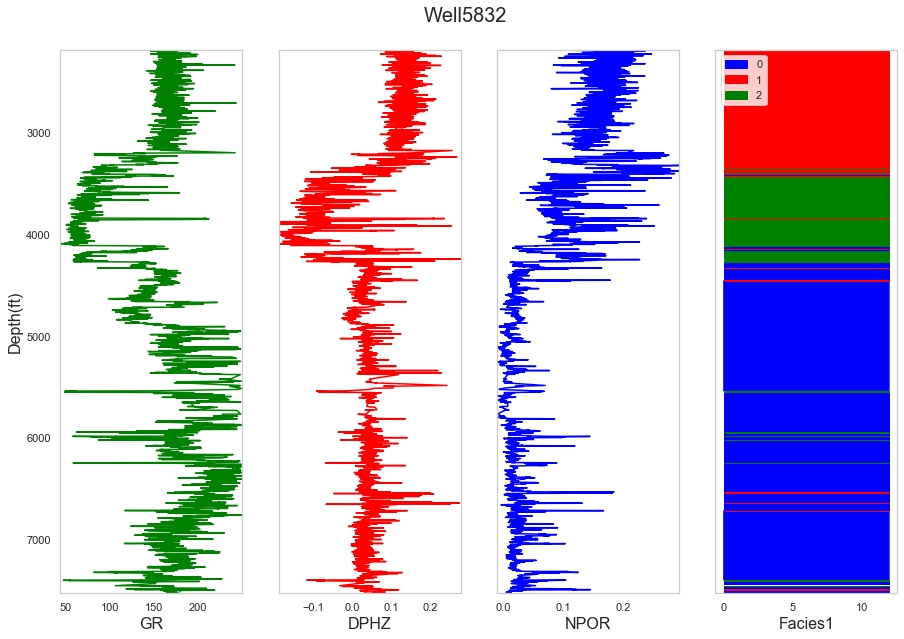

In [362]:
log_plot(K_labelled_Data)

### Comparing the clusters using the boxplot

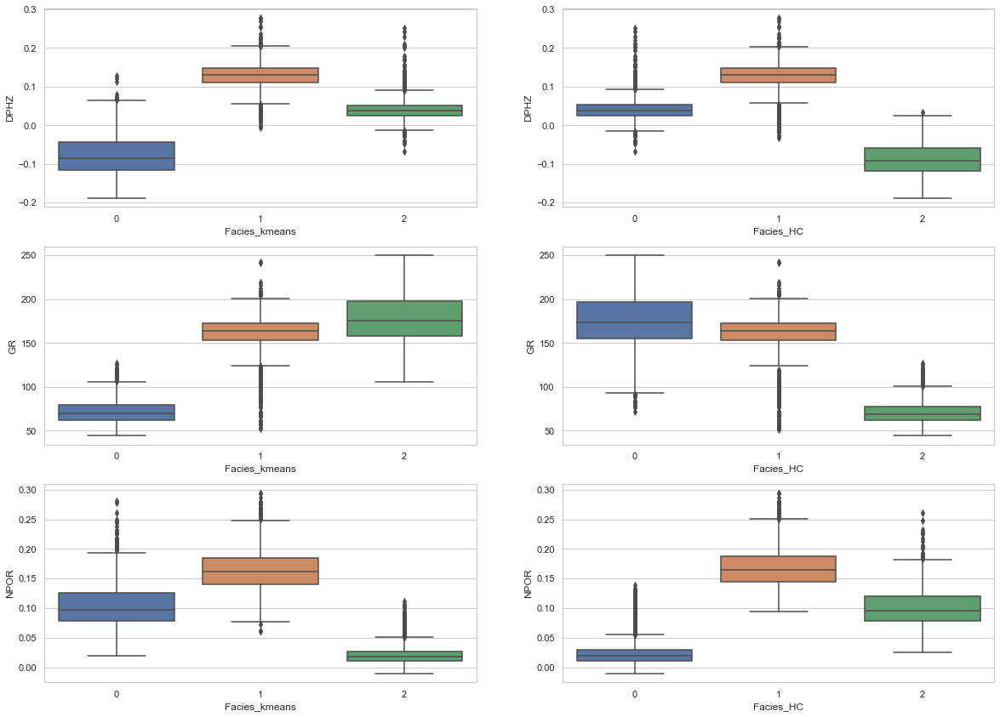

In [370]:
plt.figure(figsize = (20,30)) 
plt.subplot(6, 2, 1)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['DPHZ'])

plt.subplot(6, 2, 2)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_HC'], y=K_labelled_Data['DPHZ'])

plt.subplot(6, 2, 3)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['GR'])

plt.subplot(6, 2, 4)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_HC'], y=K_labelled_Data['GR'])

plt.subplot(6, 2, 5)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['NPOR'])

plt.subplot(6, 2, 6)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_HC'], y=K_labelled_Data['NPOR'])






In [ ]:
# Kmeans and Hierarchical Clustering performed similarly

# Construction Of Regression Model (Model 2)

The objective is to construct a regression model that predicts ROP using the drilling parameters and cluster labesls in KMeans clustering

   2. Different machine learning algorithms would be employed in creating different experimental models and the best model selected based on metrics (R2 score, RMSE value, MAPE values.etc..) 

In [371]:
E_facies=K_labelled_Data[['Facies_kmeans']]

In [372]:
D_Parameters['ELECTROFACIES'] =E_facies

In [373]:
D_Parameters.head()

,DEPTH,ROP,WOB,RPM,FLOW_IN,SPP,TORQ,ELECTROFACIES
0,2182,39.62,27.81,71.03,684.27,1063.55,103.64,1
1,2183,32.47,15.31,66.92,692.04,1065.43,138.44,1
2,2184,54.32,25.61,54.86,683.45,1065.16,143.06,1
3,2186,50.00,15.09,0.00,708.21,1067.48,39.78,1
4,2188,14.07,14.89,77.50,701.66,1064.21,149.23,1


In [374]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

INPUT_2 = D_Parameters[['RPM', 'WOB', 'FLOW_IN','SPP','TORQ','ELECTROFACIES']].to_numpy()                    
INPUT_2_scaled = scaler.fit_transform(INPUT_2)                              
INPUT_2_scaled_df = pd.DataFrame (INPUT_2_scaled, columns = ['RPM', 'WOB', 'FLOW_IN','SPP','TORQ','ELECTROFACIES']) 


In [375]:
INPUT_2_scaled_df.head()

,RPM,WOB,FLOW_IN,SPP,TORQ,ELECTROFACIES
0,0.782872,0.572643,0.445431,0.091390,0.331690,0.5
1,0.737573,0.240637,0.459600,0.092893,0.487674,0.5
2,0.604651,0.514210,0.443936,0.092677,0.508382,0.5
3,0.000000,0.234794,0.489086,0.094531,0.045450,0.5
4,0.854183,0.229482,0.477142,0.091918,0.536038,0.5


In [376]:
INPUT_2_scaled_df.isna().sum()

RPM              0
WOB              0
FLOW_IN          0
SPP              0
TORQ             0
ELECTROFACIES    0
dtype: int64

In [377]:
INPUT_2_scaled_df['ROP'] = ROP_raw_df #adding the unscaled output to the scaled input

In [378]:
INPUT_2_scaled_df.head()

,RPM,WOB,FLOW_IN,SPP,TORQ,ELECTROFACIES,ROP
0,0.782872,0.572643,0.445431,0.091390,0.331690,0.5,39.62
1,0.737573,0.240637,0.459600,0.092893,0.487674,0.5,32.47
2,0.604651,0.514210,0.443936,0.092677,0.508382,0.5,54.32
3,0.000000,0.234794,0.489086,0.094531,0.045450,0.5,50.00
4,0.854183,0.229482,0.477142,0.091918,0.536038,0.5,14.07


In [379]:
from sklearn.model_selection import train_test_split
train2 , test2 = train_test_split(INPUT_2_scaled_df, test_size = 0.2, random_state = 30 )


In [380]:

x2_train = train2.drop('ROP', axis=1) 
y2_train = train2['ROP']              

x2_test = test2.drop('ROP', axis = 1) 
y2_test = test2['ROP']

In [381]:
print("TRAINING DATA")
print("Size of x2_train is:", x2_train.shape)
print("Size of y2_train is:", y2_train.shape)
print("TEST DATA")
print("Size of x2_test is:", x2_test.shape)
print("Size of y2_test is:", y2_test.shape)

TRAINING DATA
Size of x2_train is: (3544, 6)
Size of y2_train is: (3544,)
TEST DATA
Size of x2_test is: (886, 6)
Size of y2_test is: (886,)


### REGRESSION WITH K-NEAREST NEIGHBOURS

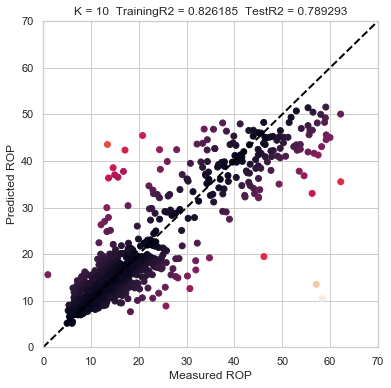

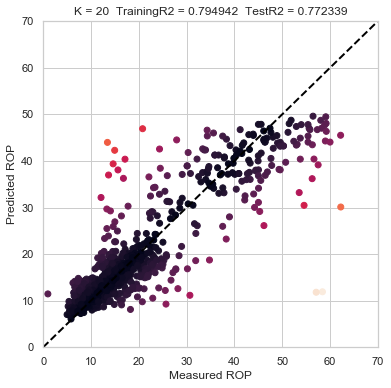

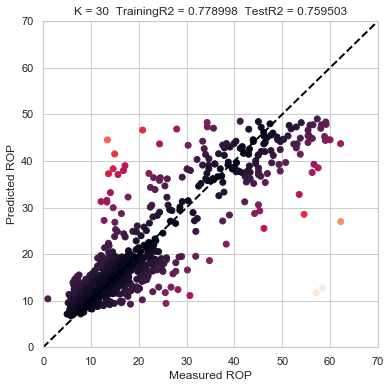

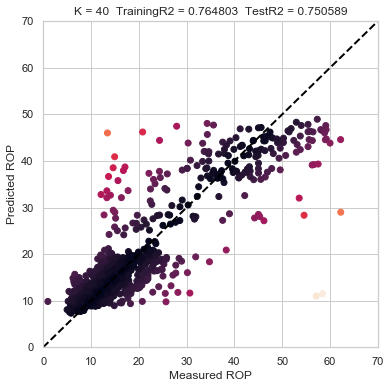

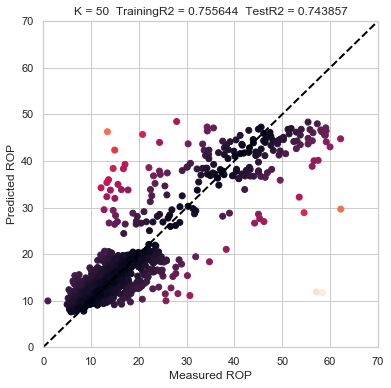

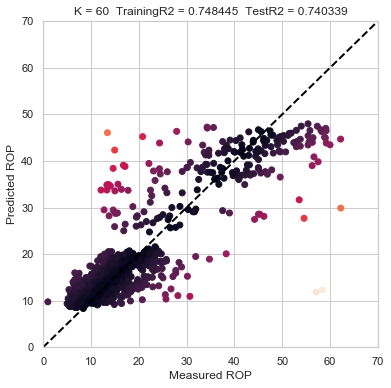

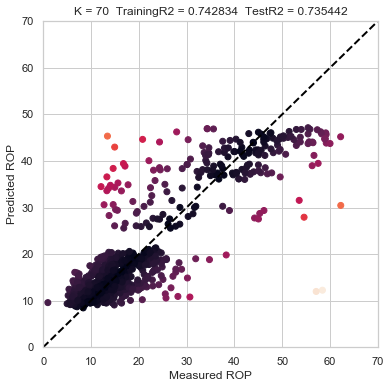

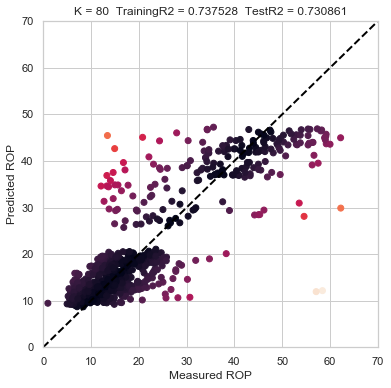

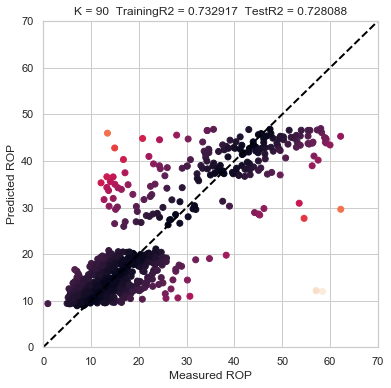

In [386]:
from sklearn import neighbors # importing K nearest neighbours
from sklearn.metrics import mean_squared_error # importing RMSE
from math import sqrt

rmse_Val = [] 
k_Val = []    
R_2 = []       

for K in range(10, 100, 10): 

    k_Val.append(K) 
    mod2_trial = neighbors.KNeighborsRegressor(n_neighbors = K)

    mod2_trial .fit(x2_train, y2_train)  # fit the model to training data
    y_pred2 = mod2_trial.predict(x2_test) 
    
    Training_R2 = mod2_trial.score(x2_train, y2_train) # Compute training R2 (correlation co-efficient for training data)
    Test_R2 = mod2_trial.score(x2_test, y2_test)       # Compute test R2
    R_2.append(Test_R2)
    
    error = sqrt(mean_squared_error(y2_test, y_pred2)) #calculate rmse
    rmse_Val.append(error)                         
    Er=abs(y2_test - y_pred2)  
   
    
    fig = plt.figure(K, figsize=(6, 6))
    plt.axis([0, 70, 0, 70])
    plt.scatter(y2_test, y_pred2, c = Er)
    plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
    plt.ylabel('Predicted ROP') # Predicted values on y axis
    plt.xlabel('Measured ROP') 
    plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%(K, Training_R2, Test_R2))

In [387]:
rmse_Val

[5.882314477843974,
 6.114381094219585,
 6.284394139445717,
 6.39980519383569,
 6.485591257946089,
 6.529983122392017,
 6.591269032122475,
 6.648085667847077,
 6.682255642626492]

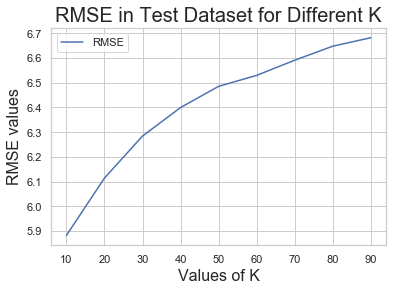

In [388]:
#plotting the rmse values against k values
plt.plot(k_Val, rmse_Val, label = 'RMSE')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('RMSE values', fontsize = 16)
plt.title ('RMSE in Test Dataset for Different K', fontsize = 20)
plt.legend()


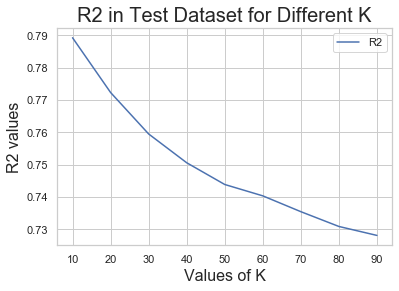

In [389]:
#plotting the test R2 values against k values
plt.plot(k_Val, R_2, label = 'R2')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('R2 values', fontsize = 16)
plt.title ('R2 in Test Dataset for Different K', fontsize = 20)
plt.legend()

In [393]:
# Best model occurs at K=10; which slightly overfits the data but a sufficiently low RMSE value 
print('the best model occurs at k=10')
print('with Training_R2 value of 0.826185')
print('with Test_R2 value of 0.789293')
print('with RMSE value of 5.882314477843974')

the best model occurs at k=10
with Training_R2 value of 0.826185
with Test_R2 value of 0.789293
with RMSE value of 5.882314477843974


### KNEAREST NEIGHBOURS WITH CROSS-VALIDATION

In [394]:
from sklearn.model_selection import KFold

knn_cv = KFold(n_splits=10, shuffle = True, random_state=30)


In [395]:
from sklearn.model_selection import GridSearchCV

knnparam_grid = { 'n_neighbors': [10, 20, 30, 40], 'weights': ['uniform', 'distance'], 'metric':['euclidean','manhattan','minkowski']}
# dictionary with keys

knngrid = GridSearchCV(mod2_trial, param_grid=knnparam_grid, cv=knn_cv , verbose=3)


In [396]:
knngrid.fit(x2_train, y2_train)

Fitting 10 folds for each of 24 candidates, totalling 240 fits
[CV 1/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 2/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 3/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 4/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 5/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 6/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 7/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 8/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 9/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 10/10] END metric=euclidean, n_neighbors=10, weights=uniform; total time=   0.0s
[CV 1/10] END metric=euclidean, n_neighbors=10, weights=distance; total time=   0.0s
[CV 2/10] E

[CV 1/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 2/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 3/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 4/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 5/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 6/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 7/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 8/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 9/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 10/10] END metric=manhattan, n_neighbors=20, weights=uniform; total time=   0.0s
[CV 1/10] END metric=manhattan, n_neighbors=20, weights=distance; total time=   0.0s
[CV 2/10] END metric=manhattan, n_neighbors=20, weights=distance; total ti

[CV 8/10] END metric=minkowski, n_neighbors=20, weights=distance; total time=   0.0s
[CV 9/10] END metric=minkowski, n_neighbors=20, weights=distance; total time=   0.0s
[CV 10/10] END metric=minkowski, n_neighbors=20, weights=distance; total time=   0.0s
[CV 1/10] END metric=minkowski, n_neighbors=30, weights=uniform; total time=   0.0s
[CV 2/10] END metric=minkowski, n_neighbors=30, weights=uniform; total time=   0.0s
[CV 3/10] END metric=minkowski, n_neighbors=30, weights=uniform; total time=   0.0s
[CV 4/10] END metric=minkowski, n_neighbors=30, weights=uniform; total time=   0.0s
[CV 5/10] END metric=minkowski, n_neighbors=30, weights=uniform; total time=   0.0s
[CV 6/10] END metric=minkowski, n_neighbors=30, weights=uniform; total time=   0.0s
[CV 7/10] END metric=minkowski, n_neighbors=30, weights=uniform; total time=   0.0s
[CV 8/10] END metric=minkowski, n_neighbors=30, weights=uniform; total time=   0.0s
[CV 9/10] END metric=minkowski, n_neighbors=30, weights=uniform; total t

GridSearchCV(cv=KFold(n_splits=10, random_state=30, shuffle=True),
             estimator=KNeighborsRegressor(n_neighbors=90),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': [10, 20, 30, 40],
                         'weights': ['uniform', 'distance']},
             verbose=3)

In [397]:
 #print(knngrid.cv_results_)


In [398]:
knn_cv_results = pd.DataFrame(knngrid.cv_results_)

In [399]:
#knn_cv_results.head()

In [400]:
knn_cv_results_slct=knn_cv_results[['param_n_neighbors','param_weights','param_metric','mean_test_score']] #add mean_test_score to data
knn_cv_results_slct.sort_index(by='mean_test_score', ascending=False).head(5) # ranking the best parameters based on thier scores

,param_n_neighbors,param_weights,param_metric,mean_test_score
9,10,distance,manhattan,0.809876
17,10,distance,minkowski,0.806448
1,10,distance,euclidean,0.806448
11,20,distance,manhattan,0.806095
13,30,distance,manhattan,0.799918


In [401]:
print(knngrid.best_params_)
print(knngrid.best_estimator_) # showing the parameters of the best estimator 


{'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'distance'}
KNeighborsRegressor(metric='manhattan', n_neighbors=10, weights='distance')


In [402]:
# Creating a model with the best estimator

KNNbest_model2=knngrid.best_estimator_

In [403]:
KNNbest_model2_ypred=KNNbest_model2.predict(x2_test)
KNNbest_model2_test_R2 = KNNbest_model2.score(x2_test, y2_test)
print("R2 = ", KNNbest_model2_test_R2)


R2 =  0.8163314925535047


Text(0.5, 1.0, 'TestR2 = 0.816331')

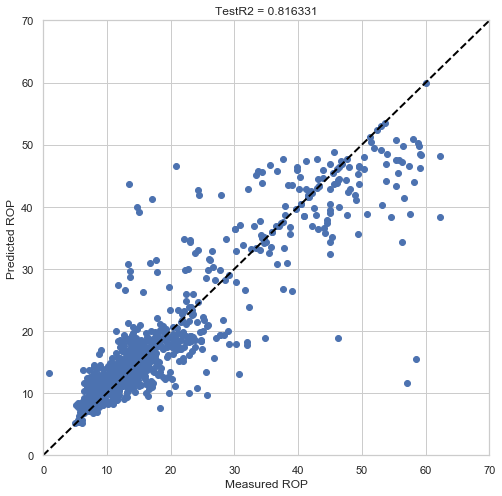

In [404]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0, 70, 0, 70])
plt.scatter(y2_test, KNNbest_model2_ypred)
plt.plot([0,160],[0,160],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted ROP') # Predicted values on y axis
plt.xlabel('Measured ROP') 
plt.title('TestR2 = %f'%(KNNbest_model2_test_R2))

In [406]:
 Error = sqrt(mean_squared_error(y2_test, KNNbest_model2_ypred))

In [407]:
print( Error)

5.491942644014673


In [409]:
print('knn best model is KNNbest_model2')
print('with Training_R2 value of' ,0.809876)
print('with Test_R2 value of' ,KNNbest_model2_test_R2)
print('and a RMSE value of', Error)

knn best model is KNNbest_model2
with Training_R2 value of 0.809876
with Test_R2 value of 0.8163314925535047
and a RMSE value of 5.491942644014673


### REGRESSION WITH RANDOM FOREST

In [410]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 


mod2_RF = RandomForestRegressor(n_estimators=100, max_depth=4) # Random Forest model with random hyperparameters


In [411]:
mod2rf_cv = KFold(n_splits=10, shuffle = True, random_state=400)


In [412]:
mod2rf_param = { 'bootstrap': [True], 'max_depth': [5,6,7], 'min_samples_split': [5,10],'max_samples': [2000, 3000, 4000], 'n_estimators': [500, 1000]}
# dictionary with keys

mod2rf_grid = GridSearchCV(RandFst, param_grid=mod2rf_param, cv=mod2rf_cv, verbose=3)


In [413]:
mod2rf_grid .fit(x2_train, y2_train)

Fitting 10 folds for each of 36 candidates, totalling 360 fits
[CV 1/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.4s
[CV 2/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   1.8s
[CV 3/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.0s
[CV 4/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.1s
[CV 5/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   1.9s
[CV 6/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   1.8s
[CV 7/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   1.9s
[CV 8/10] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=5, n_estimators=500; tota

[CV 9/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=500; total time=   2.4s
[CV 10/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=500; total time=   3.5s
[CV 1/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   5.5s
[CV 2/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   4.6s
[CV 3/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   5.5s
[CV 4/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   5.1s
[CV 5/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   4.6s
[CV 6/10] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   4.6s
[CV 7/10] END bootstrap=True, max

[CV 8/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=5, n_estimators=1000; total time=   4.8s
[CV 9/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=5, n_estimators=1000; total time=   4.5s
[CV 10/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=5, n_estimators=1000; total time=   4.7s
[CV 1/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.5s
[CV 2/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.4s
[CV 3/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.3s
[CV 4/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.0s
[CV 5/10] END bootstrap=True, max_depth=6, max_samples=2000, min_samples_split=10, n_estimators=500; total time=   2.0s
[CV 6/10] END bootstrap=True, max_depth

[CV 1/10] END bootstrap=True, max_depth=7, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   3.0s
[CV 2/10] END bootstrap=True, max_depth=7, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.3s
[CV 3/10] END bootstrap=True, max_depth=7, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.4s
[CV 4/10] END bootstrap=True, max_depth=7, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.4s
[CV 5/10] END bootstrap=True, max_depth=7, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.7s
[CV 6/10] END bootstrap=True, max_depth=7, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.4s
[CV 7/10] END bootstrap=True, max_depth=7, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.3s
[CV 8/10] END bootstrap=True, max_depth=7, max_samples=2000, min_samples_split=5, n_estimators=500; total time=   2.8s
[CV 9/10] END bootstrap=True, max_depth=7, max_s

[CV 10/10] END bootstrap=True, max_depth=7, max_samples=3000, min_samples_split=10, n_estimators=500; total time=   4.0s
[CV 1/10] END bootstrap=True, max_depth=7, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   8.1s
[CV 2/10] END bootstrap=True, max_depth=7, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   7.5s
[CV 3/10] END bootstrap=True, max_depth=7, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   8.1s
[CV 4/10] END bootstrap=True, max_depth=7, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   7.1s
[CV 5/10] END bootstrap=True, max_depth=7, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   7.1s
[CV 6/10] END bootstrap=True, max_depth=7, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   7.2s
[CV 7/10] END bootstrap=True, max_depth=7, max_samples=3000, min_samples_split=10, n_estimators=1000; total time=   6.4s
[CV 8/10] END bootstrap=True, ma

GridSearchCV(cv=KFold(n_splits=10, random_state=400, shuffle=True),
             estimator=RandomForestRegressor(max_depth=4),
             param_grid={'bootstrap': [True], 'max_depth': [5, 6, 7],
                         'max_samples': [2000, 3000, 4000],
                         'min_samples_split': [5, 10],
                         'n_estimators': [500, 1000]},
             verbose=3)

In [414]:
#mod2rf_grid.cv_results_


In [415]:
mod2rf_gridcv_results = pd.DataFrame(mod2rf_grid.cv_results_)


In [416]:
#mod2rf_gridcv_results.head(5)

In [417]:
mod2rf_gridcv_results_slct=grid_rfcv_results[['param_max_depth','param_min_samples_split','param_max_samples','param_n_estimators','mean_test_score']] #add mean_test_score to data
mod2rf_gridcv_results_slct.sort_index(by='mean_test_score', ascending=False).head(5)


,param_max_depth,param_min_samples_split,param_max_samples,param_n_estimators,mean_test_score
110,6,5,2000,1000,0.737286
109,6,5,2000,500,0.737044
111,6,10,2000,100,0.736531
117,6,5,3000,100,0.736343
112,6,10,2000,500,0.736200


In [418]:
print(mod2rf_grid.best_params_)
print(mod2rf_grid.best_estimator_) # showing the parameters of the best random forest regression model 


{'bootstrap': True, 'max_depth': 7, 'max_samples': 3000, 'min_samples_split': 5, 'n_estimators': 1000}
RandomForestRegressor(max_depth=7, max_samples=3000, min_samples_split=5,
                      n_estimators=1000)


In [419]:
mod2rf_best=mod2rf_grid.best_estimator_

In [420]:
mod2rf_best_ypred=mod2rf_best.predict(x2_test)
mod2rf_best_R2 = mod2rf_best.score(x2_test, y2_test)
print("R2 = ", mod2rf_best_R2)

R2 =  0.7886619514456235


Text(0.5, 1.0, 'TestR2 = 0.788662')

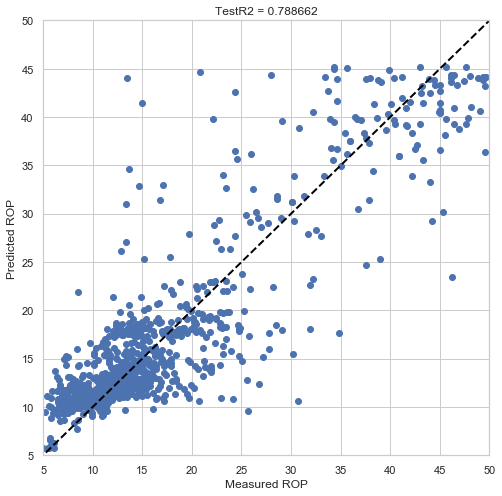

In [421]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([5, 50, 5, 50])
plt.scatter(y2_test, mod2rf_best_ypred)
plt.plot([0,160],[0,160],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted ROP') # Predicted values on y axis
plt.xlabel('Measured ROP') 
plt.title('TestR2 = %f'%(mod2rf_best_R2))

In [422]:
 rfError = sqrt(mean_squared_error(y2_test, mod2rf_best_ypred))


In [423]:
print('randomforest best model is mod2rf_best')
print('with Training_R2 value of' ,'0.737286')
print('with Test_R2 value of' ,mod2rf_best_R2)
print('and a RMSE value of', rfError)

randomforest best model is mod2rf_best
with Training_R2 value of 0.737286
with Test_R2 value of 0.7886619514456235
and a RMSE value of 5.891114869677429


In [424]:
rfimportances = list(mod2rf_best.feature_importances_)


In [426]:

rffeature_list=list(D_Parameters[['WOB','RPM','FLOW_IN','TORQ','SPP','ELECTROFACIES']].columns)

rffeature_importances = [(feature, round(rfimportances, 2)) for feature, rfimportances in zip(rffeature_list,rfimportances)]

# Sort the feature importances by most important first
rffeature_importances= sorted(rffeature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in rffeature_importances];



Variable: ELECTROFACIES        Importance: 0.77
Variable: TORQ                 Importance: 0.09
Variable: SPP                  Importance: 0.05
Variable: WOB                  Importance: 0.03
Variable: RPM                  Importance: 0.03
Variable: FLOW_IN              Importance: 0.03


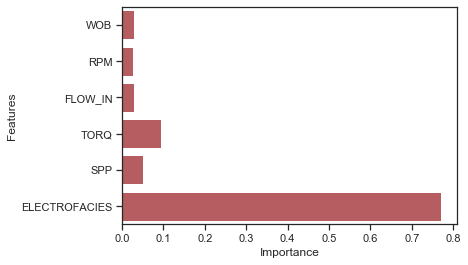

In [427]:
feature_dataframe = pd.DataFrame(data = rffeature_list, columns = ['Features'])
feature_dataframe['Importance'] = rfimportances 

sns.set(style = 'ticks')
sns.barplot(x = 'Importance', y = 'Features', data = feature_dataframe, color="r")

In [ ]:
#Using important paramters

In [433]:
bestrf_input=INPUT_2_scaled_df[['ELECTROFACIES','TORQ','SPP','ROP']]

In [434]:
bestrf_input.isna().sum()

ELECTROFACIES    0
TORQ             0
SPP              0
ROP              0
dtype: int64

In [435]:
from sklearn.model_selection import train_test_split
train3 , test3 = train_test_split(bestrf_input, test_size = 0.15, random_state = 30)

In [436]:
x3_train = train3.drop('ROP', axis=1) 
y3_train = train3['ROP']              

x3_test = test3.drop('ROP', axis = 1) 
y3_test = test3['ROP']

In [536]:
x3_train.shape


(3765, 3)

In [437]:
mod2rf_best.fit(x3_train, y3_train)

RandomForestRegressor(max_depth=7, max_samples=3000, min_samples_split=5,
                      n_estimators=1000)

In [440]:
 mod2rf_best_Training_R2 = mod2rf_best.score(x3_train, y3_train)
print(mod2rf_best_Training_R2 )

0.7947614524046576


In [438]:
mod2rf_best_yp=mod2rf_best.predict(x3_test)
mod2rf_best_R2 = mod2rf_best.score(x3_test, y3_test)
print("R2 = ", mod2rf_best_R2)

R2 =  0.7425720605672723


In [538]:
Imp_Error= sqrt(mean_squared_error(y3_test,mod2rf_best_yp))

print(Imp_Error)

6.623930072182157


In [ ]:
# Using the important parameters improved the training score but not the test score and the RMSE value

### MLP REGRESSOR

In [462]:
NN_Reg2= MLPRegressor(hidden_layer_sizes=100, max_iter=100, random_state=10)

In [463]:
cv_nn2 = KFold(n_splits=5, shuffle = True, random_state=125)


In [466]:

from sklearn.model_selection import GridSearchCV
param_grid_nn2 = {'hidden_layer_sizes': [10, 20, 30],'solver':['lbfgs','sgd', 'adam'],'activation': ['identity', 'tanh', 'relu','logistic'], 'max_iter': [100,200,300]}
# dictionary with keys

grid_nn2 = GridSearchCV(NN_Reg2, param_grid=param_grid_nn2 , cv=cv_nn , verbose=3)

In [467]:
grid_nn2.fit(x2_train, y2_train)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV 1/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 2/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 3/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 4/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 5/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=lbfgs; total time=   0.0s
[CV 1/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.3s
[CV 2/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.2s
[CV 3/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.3s
[CV 4/5] END activation=identity, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.3s
[CV 5/5] 

[CV 5/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=lbfgs; total time=   0.0s
[CV 1/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.3s
[CV 2/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.3s
[CV 3/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.3s
[CV 4/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.2s
[CV 5/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=sgd; total time=   0.3s
[CV 1/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.2s
[CV 2/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.4s
[CV 3/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.2s
[CV 4/5] END activation=identity, hidden_layer_sizes=20, max_iter=300, solver

[CV 1/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   0.9s
[CV 2/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   0.9s
[CV 3/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   1.0s
[CV 4/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   1.2s
[CV 5/5] END activation=tanh, hidden_layer_sizes=10, max_iter=200, solver=adam; total time=   1.1s
[CV 1/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.3s
[CV 2/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.2s
[CV 3/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.2s
[CV 4/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.2s
[CV 5/5] END activation=tanh, hidden_layer_sizes=10, max_iter=300, solver=lbfgs; total time=   0.2s
[CV 1

[CV 4/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=lbfgs; total time=   0.5s
[CV 5/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=lbfgs; total time=   0.6s
[CV 1/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.5s
[CV 2/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.4s
[CV 3/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.4s
[CV 4/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.4s
[CV 5/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=sgd; total time=   1.3s
[CV 1/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=adam; total time=   1.6s
[CV 2/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=adam; total time=   1.5s
[CV 3/5] END activation=tanh, hidden_layer_sizes=30, max_iter=200, solver=adam; total time=   1.9s
[CV 4/5] END 

[CV 2/5] END activation=relu, hidden_layer_sizes=20, max_iter=100, solver=adam; total time=   0.4s
[CV 3/5] END activation=relu, hidden_layer_sizes=20, max_iter=100, solver=adam; total time=   0.4s
[CV 4/5] END activation=relu, hidden_layer_sizes=20, max_iter=100, solver=adam; total time=   0.4s
[CV 5/5] END activation=relu, hidden_layer_sizes=20, max_iter=100, solver=adam; total time=   0.4s
[CV 1/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 2/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 3/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 4/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 5/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=lbfgs; total time=   0.2s
[CV 1/5] END activation=relu, hidden_layer_sizes=20, max_iter=200, solver=sgd; total time=   0.8s
[CV 2/

[CV 1/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.3s
[CV 2/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.3s
[CV 3/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.4s
[CV 4/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.4s
[CV 5/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=sgd; total time=   0.3s
[CV 1/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=adam; total time=   0.4s
[CV 2/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=adam; total time=   0.5s
[CV 3/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=adam; total time=   0.4s
[CV 4/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=adam; total time=   0.4s
[CV 5/5] END activation=logistic, hidden_layer_sizes=10, max_iter=100, solver=

[CV 1/5] END activation=logistic, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.7s
[CV 2/5] END activation=logistic, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.5s
[CV 3/5] END activation=logistic, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.5s
[CV 4/5] END activation=logistic, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   1.5s
[CV 5/5] END activation=logistic, hidden_layer_sizes=20, max_iter=300, solver=adam; total time=   3.2s
[CV 1/5] END activation=logistic, hidden_layer_sizes=30, max_iter=100, solver=lbfgs; total time=   0.2s
[CV 2/5] END activation=logistic, hidden_layer_sizes=30, max_iter=100, solver=lbfgs; total time=   0.2s
[CV 3/5] END activation=logistic, hidden_layer_sizes=30, max_iter=100, solver=lbfgs; total time=   0.2s
[CV 4/5] END activation=logistic, hidden_layer_sizes=30, max_iter=100, solver=lbfgs; total time=   0.2s
[CV 5/5] END activation=logistic, hidden_layer_sizes=30, max_iter=100

GridSearchCV(cv=KFold(n_splits=5, random_state=125, shuffle=True),
             estimator=MLPRegressor(hidden_layer_sizes=100, max_iter=100,
                                    random_state=10),
             param_grid={'activation': ['identity', 'tanh', 'relu', 'logistic'],
                         'hidden_layer_sizes': [10, 20, 30],
                         'max_iter': [100, 200, 300],
                         'solver': ['lbfgs', 'sgd', 'adam']},
             verbose=3)

In [469]:
#grid_nn2.cv_results_


In [470]:
grid_nn2cv_results = pd.DataFrame(grid_nn2.cv_results_)


In [471]:
#grid_nn2cv_results.head(5)


In [472]:
grid_nn2cv_results_slct=grid_nn2cv_results[['param_hidden_layer_sizes','param_solver','param_activation','param_max_iter','mean_test_score']] #add mean_test_score to data
grid_nn2cv_results_slct.sort_index(by='mean_test_score', ascending=False).head(5)


,param_hidden_layer_sizes,param_solver,param_activation,param_max_iter,mean_test_score
102,30,lbfgs,logistic,200,0.758356
105,30,lbfgs,logistic,300,0.756402
96,20,lbfgs,logistic,300,0.754613
93,20,lbfgs,logistic,200,0.752464
90,20,lbfgs,logistic,100,0.751611


In [473]:
print(grid_nn2.best_params_)
print(grid_nn2.best_estimator_) # showing the parameters of the best random forest regression model 

{'activation': 'logistic', 'hidden_layer_sizes': 30, 'max_iter': 200, 'solver': 'lbfgs'}
MLPRegressor(activation='logistic', hidden_layer_sizes=30, random_state=10,
             solver='lbfgs')


In [474]:
grid_nn2_best=grid_nn2.best_estimator_


In [475]:

grid_nn2_best_ypred=grid_nn2_best.predict(x2_test)
grid_nn2_best_R2 = grid_nn2_best.score(x2_test, y2_test)
print("R2 = ", grid_nn2_best_R2)


R2 =  0.7658101713289557


Text(0.5, 1.0, 'TestR2 = 0.765810')

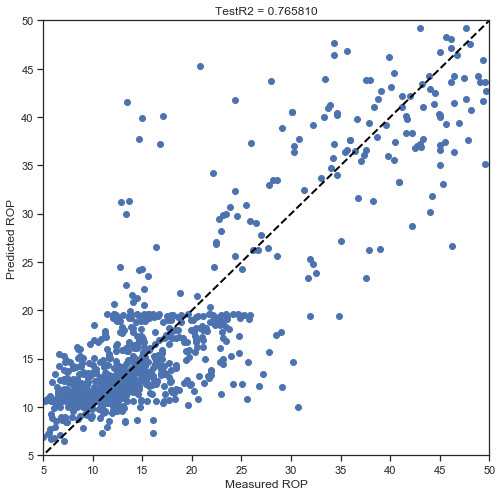

In [476]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([5, 50, 5, 50])
plt.scatter(y2_test, grid_nn2_best_ypred)
plt.plot([0,160],[0,160],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted ROP') # Predicted values on y axis
plt.xlabel('Measured ROP') 
plt.title('TestR2 = %f'%(grid_nn2_best_R2))

In [477]:
ANN_Error = sqrt(mean_squared_error(y2_test, grid_nn2_best_ypred))


In [486]:
print('ANN cv_best model is grid_nn2_best')
print('with Training_R2 value of' ,'0.758356')
print('with Test_R2 value of' ,grid_nn2_best_R2)
print('and a RMSE value of', ANN_Error )

ANN cv_best model is grid_nn2_best
with Training_R2 value of 0.758356
with Test_R2 value of 0.7658101713289557
and a RMSE value of 6.201441611124178


In [ ]:
# MLP did better with ELECTROFACIES AS PART OF THE INPUTS

## CONCLUSION (MODEL 2 DEVELOPMENT)

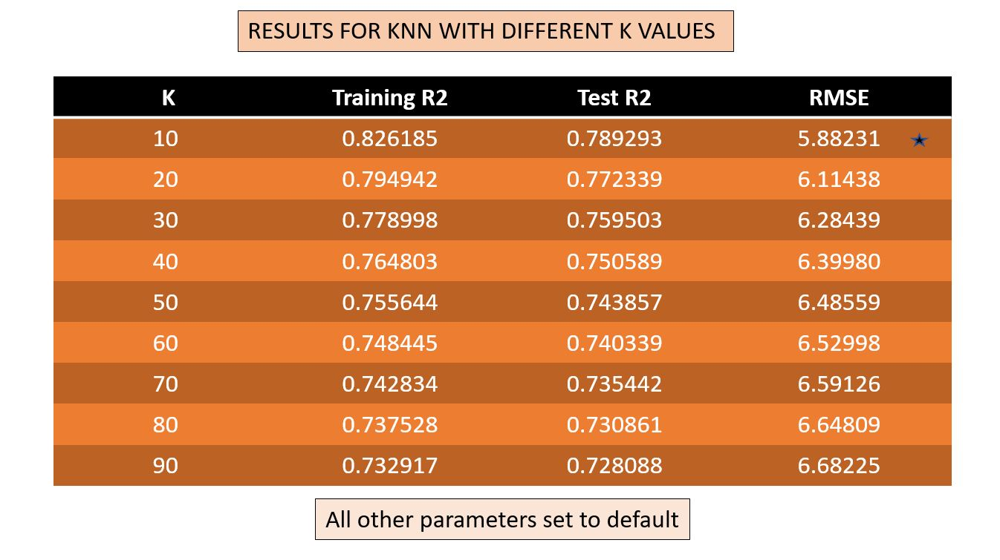

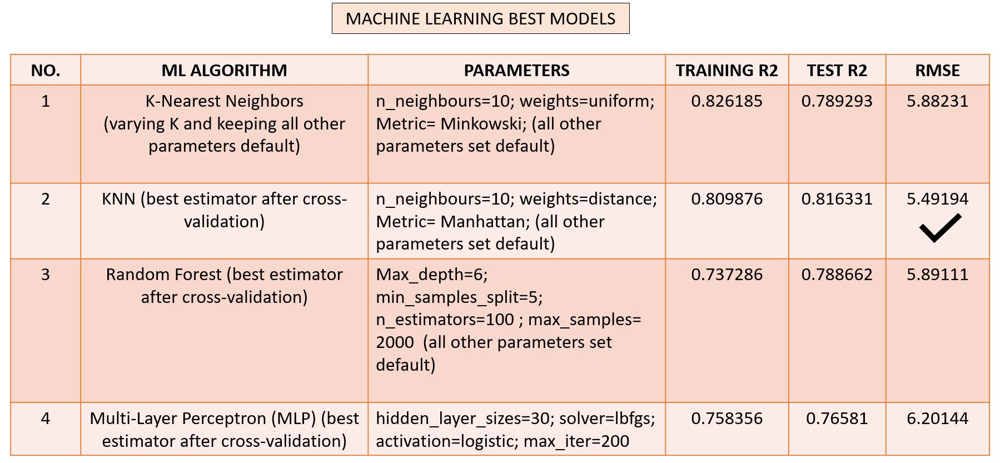

# CONCLUSION

1.For the given data set, K Nearest Neighbors showed a better ability at predicting ROP from the given input features compared to the other algorithms used 

2.Both KMeans and Hierarchical Clustering Performed Similarly Good in Clustering Well Logs

3.Including the KMeans labels (Lithology) as input in construction of Model 2 improved the Training R2 of almost all the ML algorithms and reduced the RMSE but had no significant effect on the Test R2 

4.In model 1 construction, the use of Random Forest important features as inputs for ROP prediction did not perform as expected. The Training and Test R2 values were lower compared to all the other features.
